In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load in 

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the "../input/" directory.
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # Any results you write to the current directory are saved as output.

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import QuantileTransformer , PowerTransformer


from keras.layers import Dense , LSTM
from keras.models import Sequential
from sklearn.metrics import mean_squared_error

import warnings 
warnings.filterwarnings('ignore')

%matplotlib inline
cmap = cm.get_cmap('Spectral') # Colour map (there are many others)

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import r2_score

Using TensorFlow backend.


### Workflow:

- remove noise
- standatize or normalize the dataset mainly normalize it
- now, split the dataset and apply RNN on it
- test the model on split data
- import the test file, original rul file together and find all prediced rul value
- now, get the last three rul value of prediction and average it
- now, compare that avg value with orgginal rul.
- In second, aproach can apply PCA and then do the same or can find model for individual MID (OPTIONAL)

In [3]:
# loading triain_FD001 file
train_file = "/kaggle/input/nasa-cmaps/CMaps/train_FD001.txt" 
test_file = "/kaggle/input/nasa-cmaps/CMaps/test_FD001.txt"
RUL_file = "/kaggle/input/nasa-cmaps/CMaps/RUL_FD001.txt"

df = pd.read_csv(train_file,sep=" ",header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,NaN,NaN
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,NaN,NaN
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,NaN,NaN
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,NaN,NaN
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,NaN,NaN


In [4]:
df.drop(columns=[26,27],inplace=True)

In [5]:
columns = ["Section-{}".format(i)  for i in range(26)]
df.columns = columns
df.head()

,Section-0,Section-1,Section-2,Section-3,Section-4,Section-5,Section-6,Section-7,Section-8,Section-9,...,Section-16,Section-17,Section-18,Section-19,Section-20,Section-21,Section-22,Section-23,Section-24,Section-25
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


Info about data:
- Section-0 is MachineID
- Section-1 is time in, Cycles
- Section-2...4 is Opertional Settings
- Section-5...21 is sensor's data 


- Data Set: FD001
- Train trjectories: 100
- Test trajectories: 100
- Conditions: ONE (Sea Level)
- Fault Modes: ONE (HPC Degradation)

Data sets consists of multiple multivariate time series. Each data set is further divided into training and test subsets. Each time series is from a different engine – i.e., the data can be considered to be from a fleet of engines of the same type. Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. There are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data is contaminated with sensor noise.

The engine is operating normally at the start of each time series, and develops a fault at some point during the series. In the training set, the fault grows in magnitude until system failure. In the test set, the time series ends some time prior to system failure. The objective of the competition is to predict the number of remaining operational cycles before failure in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate. Also provided a vector of true Remaining Useful Life (RUL) values for the test data.


In [6]:
# Names 
MachineID_name = ["Section-0"]
RUL_name = ["Section-1"]
OS_name = ["Section-{}".format(i) for i in range(2,5)]
Sensor_name = ["Section-{}".format(i) for i in range(5,26)]

# Data in pandas DataFrame
MachineID_data = df[MachineID_name]
RUL_data = df[RUL_name]
OS_data = df[OS_name]
Sensor_data = df[Sensor_name]

# Data in pandas Series
MachineID_series = df["Section-0"]
RUL_series = df["Section-1"]

In [7]:
MachineID_series.unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100])

In [8]:
grp = RUL_data.groupby(MachineID_series)
max_cycles = np.array([max(grp.get_group(i)["Section-1"]) for i in MachineID_series.unique()])
max_cycles

array([192, 287, 179, 189, 269, 188, 259, 150, 201, 222, 240, 170, 163,
       180, 207, 209, 276, 195, 158, 234, 195, 202, 168, 147, 230, 199,
       156, 165, 163, 194, 234, 191, 200, 195, 181, 158, 170, 194, 128,
       188, 216, 196, 207, 192, 158, 256, 214, 231, 215, 198, 213, 213,
       195, 257, 193, 275, 137, 147, 231, 172, 185, 180, 174, 283, 153,
       202, 313, 199, 362, 137, 208, 213, 213, 166, 229, 210, 154, 231,
       199, 185, 240, 214, 293, 267, 188, 278, 178, 213, 217, 154, 135,
       341, 155, 258, 283, 336, 202, 156, 185, 200])

In [9]:
print("Max Life >> ",max(max_cycles))
print("Mean Life >> ",np.mean(max_cycles))
print("Min Life >> ",min(max_cycles))

Max Life >>  362
Mean Life >>  206.31
Min Life >>  128


From the above cell we can conclude that the machine can have on an average life upto 200(approx.)cycles & in worst case it can be near about 120(approx.) cycles & in best case it can be about 360(approx.) cycles

#### Now, moving ahead in our approach of workflow data cleaing


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Section-0   20631 non-null  int64  
 1   Section-1   20631 non-null  int64  
 2   Section-2   20631 non-null  float64
 3   Section-3   20631 non-null  float64
 4   Section-4   20631 non-null  float64
 5   Section-5   20631 non-null  float64
 6   Section-6   20631 non-null  float64
 7   Section-7   20631 non-null  float64
 8   Section-8   20631 non-null  float64
 9   Section-9   20631 non-null  float64
 10  Section-10  20631 non-null  float64
 11  Section-11  20631 non-null  float64
 12  Section-12  20631 non-null  float64
 13  Section-13  20631 non-null  float64
 14  Section-14  20631 non-null  float64
 15  Section-15  20631 non-null  float64
 16  Section-16  20631 non-null  float64
 17  Section-17  20631 non-null  float64
 18  Section-18  20631 non-null  float64
 19  Section-19  20631 non-nul

In [11]:
df.describe()

,Section-0,Section-1,Section-2,Section-3,Section-4,Section-5,Section-6,Section-7,Section-8,Section-9,...,Section-16,Section-17,Section-18,Section-19,Section-20,Section-21,Section-22,Section-23,Section-24,Section-25
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,...,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,...,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,...,0.737553,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,...,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,...,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,...,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,...,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,...,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


### Now, Visulizing the sensor's value w.r.t its Cycles so, to find is there any deviation with mean in it or not 
- 'NOTE:' that all MID is taken all together for this

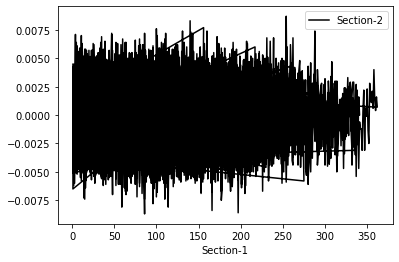

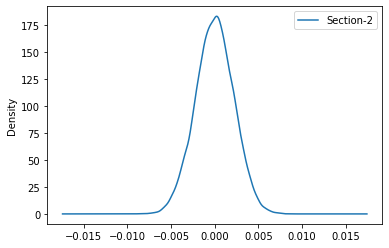

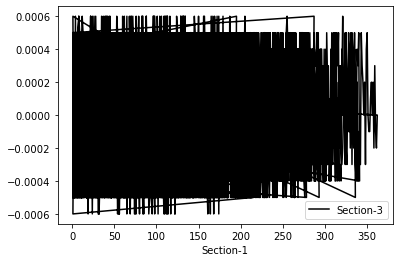

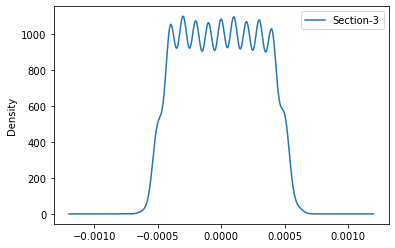

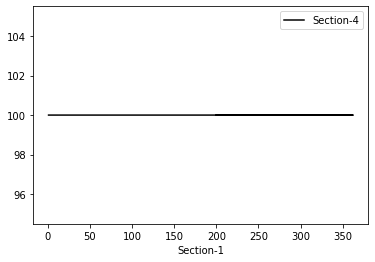

In [12]:
# Now, Initially visulizing the Operation Settings 2,3,4
df.plot(x=RUL_name[0], y= OS_name[0], c='k'); df.plot(x=RUL_name[0], y=OS_name[0], kind= "kde") 
df.plot(x=RUL_name[0], y=OS_name[1], c='k'); df.plot(x=RUL_name[0], y=OS_name[1], kind='kde')
df.plot(x=RUL_name[0], y=OS_name[2], c='k')#; df.plot(x=RUL_name[0], y=OS_name[2], kind='kde') 

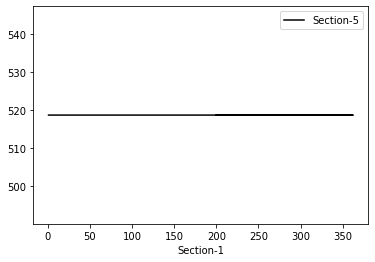

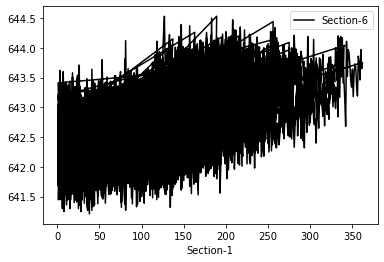

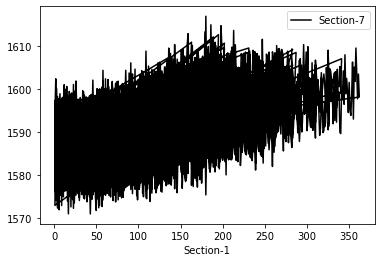

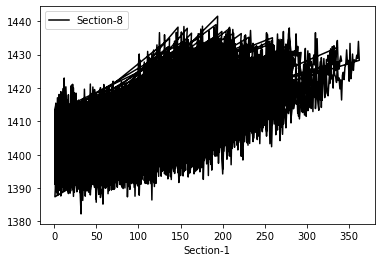

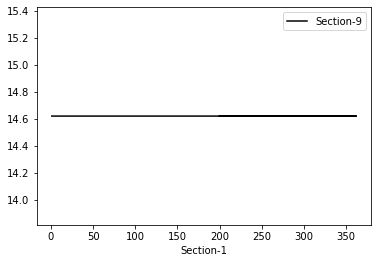

...

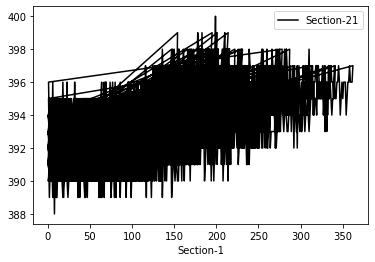

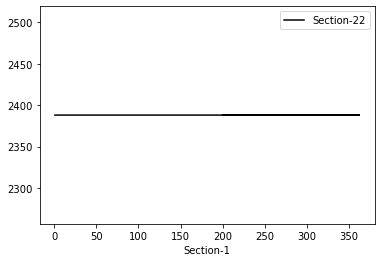

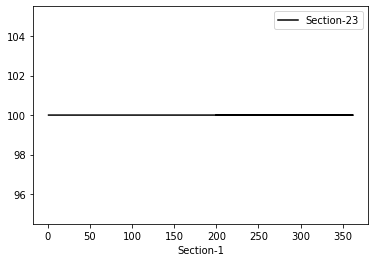

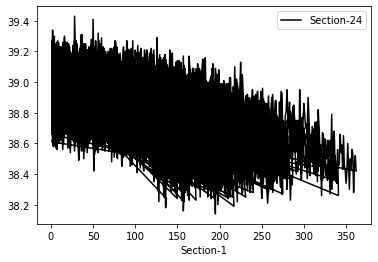

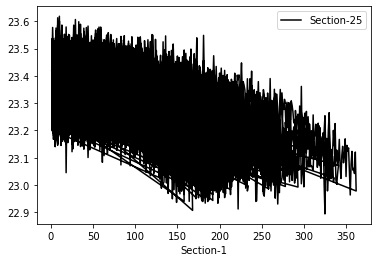

In [13]:
for name in Sensor_name:
    df.plot(x=RUL_name[0], y=name, c='k')

From the above vizulization its clear that 
- Section-4 (Oprational Setting-3)
- Section-5 (Sensor-1)
- Section-9  (Sensor-5)
- Section-14 (Sensor-10)
- Section-20 (Sensor-16)
- Section-22 (Sensor-18)
- Section-23 (Sensor-19)

Does not play a vital role in variation of data and there std is also almost 0 so, these sensor data is useless for us hence, we can drop this coloumn data

### Now, Concatenating the two df (Operating Settings & Sensor) and removing the above sensor data

In [14]:
data = pd.concat([RUL_data,OS_data,Sensor_data], axis=1)
data.drop(data[["Section-4", # Operatinal Setting
                "Section-5", # Sensor data
                "Section-9", # Sensor data
                "Section-10", # Sensor data
                "Section-14",# Sensor data
                "Section-20",# Sensor data
                "Section-22",# Sensor data
                "Section-23"]], axis=1 , inplace=True)

In [15]:
def Normalize(dataframe):
    gen = MinMaxScaler(feature_range=(0, 1))
    gen_data = gen.fit_transform(dataframe)
    return gen_data

def reshaping(train_X, train_y):
    abc = np.array(train_X).reshape(-1,1)
    asdsad= np.reshape(abc, (abc.shape[0], 1, abc.shape[1]))
    return asdsad, np.array(train_y)

In [16]:
# Making the funtion which Outputs RUL Dataframe
def RUL_df():
    rul_lst = [j  for i in MachineID_series.unique() for j in np.array(grp.get_group(i)[::-1]["Section-1"])]
    rul_col = pd.DataFrame({"rul":rul_lst})
    return rul_col

RUL_df().head()

,rul
0,192
1,191
2,190
3,189
4,188


# METHOD-1


In [17]:
#  Now, getting the data & Split it 
normalize_labels = Normalize(np.array(RUL_df()).reshape(-1,1)).reshape(1,-1)[0]
# print(normalize_labels.reshape(1,-1)[0])

train_X , test_X , train_Y , test_Y = train_test_split(Normalize(data),normalize_labels , test_size = 0.2)

In [18]:
#### Moving towards the model making and it's requiste
def lstm_reshaping(train_X, train_y):
    train_X = np.reshape(train_X, (train_X.shape[0], 1, train_X.shape[1]))
    train_Y = np.array(train_y).reshape(1,-1)[0]
    return train_X, train_Y

In [19]:
# Making data according to model input requirements:
trainX, trainY = lstm_reshaping(train_X, train_Y)
testX, testY = lstm_reshaping(test_X, test_Y)

# Examining
print(trainX.shape)
print(testX.shape)

(16504, 1, 17)
(4127, 1, 17)


In [20]:
look_back = 17
# Model
model = Sequential()
model.add(LSTM(32, input_shape=(1, look_back)))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam',metrics=['accuracy'])

In [21]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 32)                6400      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 6,433
Trainable params: 6,433
Non-trainable params: 0
_________________________________________________________________


In [22]:
history = model.fit(trainX, trainY, epochs=10, batch_size=4, validation_data=(testX, testY))

Train on 16504 samples, validate on 4127 samples
Epoch 1/10
16504/16504 [==============================] - 9s 570us/step - loss: 0.0133 - accuracy: 0.0052 - val_loss: 0.0118 - val_accuracy: 0.0036
Epoch 2/10
16504/16504 [==============================] - 9s 521us/step - loss: 0.0113 - accuracy: 0.0052 - val_loss: 0.0104 - val_accuracy: 0.0036
Epoch 3/10
16504/16504 [==============================] - 9s 550us/step - loss: 0.0109 - accuracy: 0.0052 - val_loss: 0.0101 - val_accuracy: 0.0036
Epoch 4/10
16504/16504 [==============================] - 9s 561us/step - loss: 0.0107 - accuracy: 0.0052 - val_loss: 0.0105 - val_accuracy: 0.0036
Epoch 5/10
16504/16504 [==============================] - 9s 535us/step - loss: 0.0106 - accuracy: 0.0052 - val_loss: 0.0105 - val_accuracy: 0.0036
Epoch 6/10
16504/16504 [==============================] - 9s 539us/step - loss: 0.0105 - accuracy: 0.0052 - val_loss: 0.0099 - val_accuracy: 0.0036
Epoch 7/10
16504/16504 [==============================] - 9s 53

#### Plotting accuracy & loss graph


In [23]:
print(history.history.keys())

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


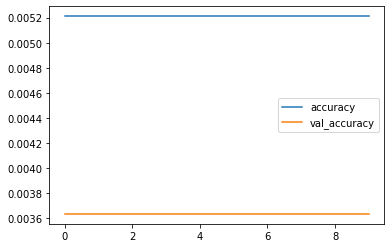

In [24]:
# Accuracy Graph
plt.plot(history.epoch, history.history['accuracy'] , label="accuracy")
plt.plot(history.epoch, history.history['val_accuracy'] , label = "val_accuracy")
plt.legend()
plt.show()

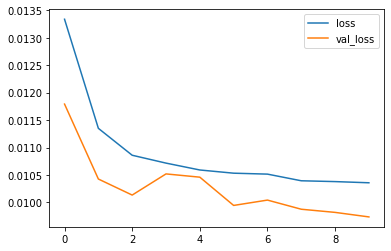

In [25]:
# Loss Graph
plt.plot(history.epoch, history.history['loss'] , label = "loss")
plt.plot(history.epoch, history.history['val_loss'] , label = "val_loss")
plt.legend()
plt.show()

In [26]:
# Now Making the Prediction and Evaluating the model
score = model.evaluate(testX, testY, verbose = 0)
print("%s: %.2f%%" % ("acc", score[1]*100))

acc: 0.36%


4127
4127


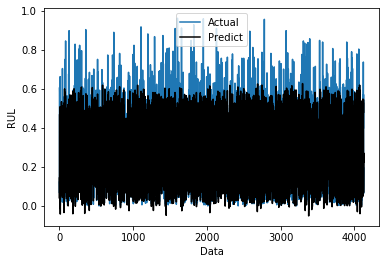

In [27]:
# Checking the model prediction on graphical form 
print(len(testY))
print(len(testX))

plt.plot(testY, label = "Actual")
plt.xlabel("Data");plt.ylabel("RUL")

val = model.predict(testX)
plst = [i[0] for i in val]
plt.plot(plst, c='k', label="Predict")
plt.legend();plt.show()

# METHOD-2

### Removing noise by rolling mean for each machine ID


In [28]:
def rolling_mean(pandas_df):
    data = pandas_df.rolling(20).mean()
    return data

def method_PCA(df):
    pca = PCA(n_components=1)
    data = pca.fit_transform(Normalize(df))
    return data

def transform_data(data):
    pt = PowerTransformer()
    transform_data = pt.fit_transform(data)
    return transform_data 

In [29]:
# grouping w.r.t MID (Machine ID)
col_names = data.columns
def grouping(datafile, mid_series):
    data = [x for x in datafile.groupby(mid_series)]
    return data  

----------------MachineID-1----------------


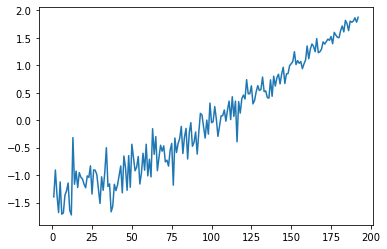

----------------MachineID-2----------------


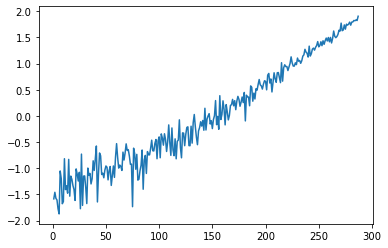

----------------MachineID-3----------------


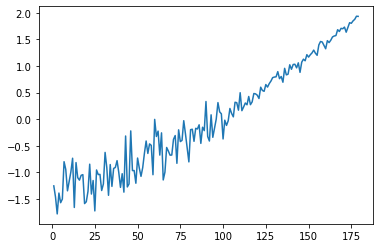

----------------MachineID-4----------------


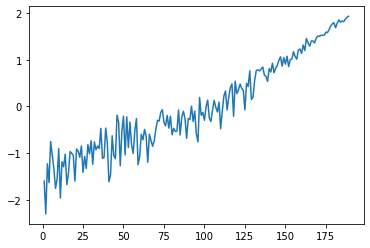

----------------MachineID-5----------------


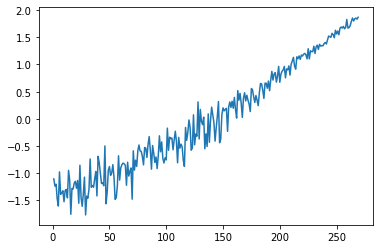

----------------MachineID-6----------------


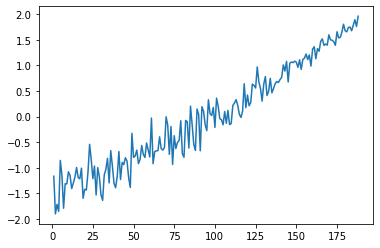

----------------MachineID-7----------------


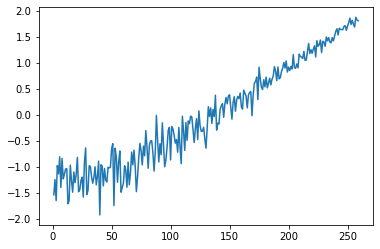

----------------MachineID-8----------------


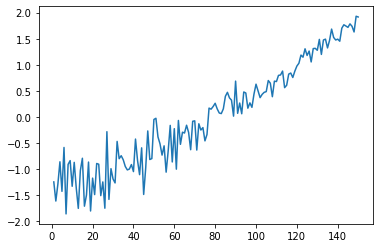

----------------MachineID-9----------------


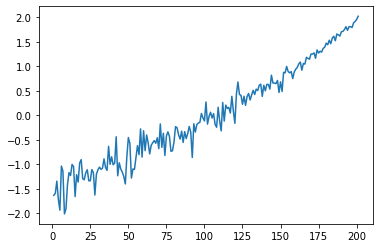

----------------MachineID-10----------------


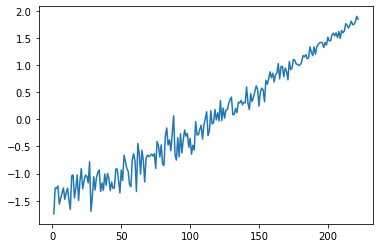

----------------MachineID-11----------------


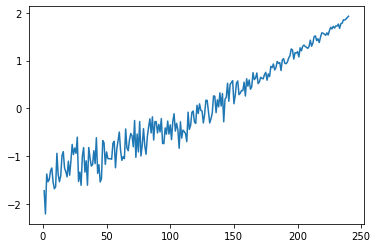

----------------MachineID-12----------------


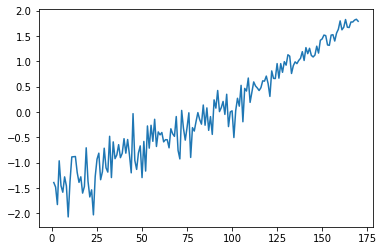

----------------MachineID-13----------------


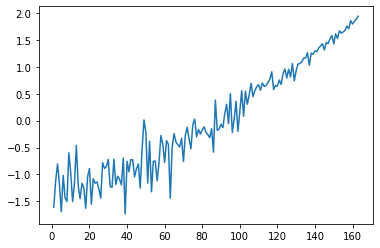

----------------MachineID-14----------------


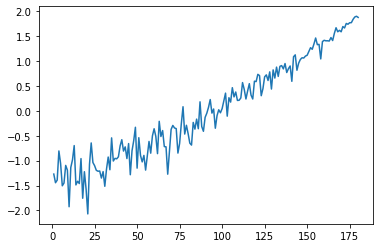

----------------MachineID-15----------------


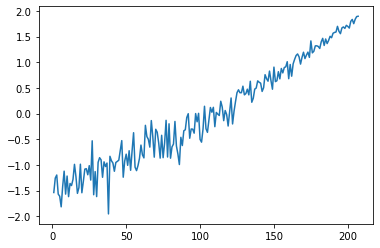

----------------MachineID-16----------------


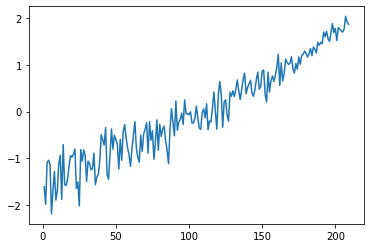

----------------MachineID-17----------------


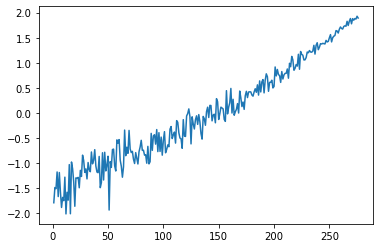

----------------MachineID-18----------------


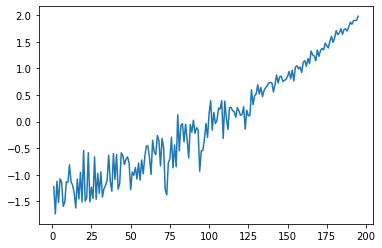

----------------MachineID-19----------------


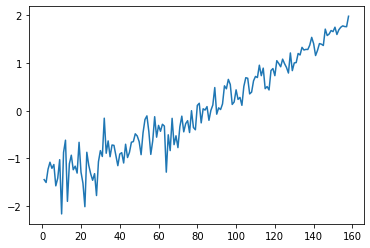

----------------MachineID-20----------------


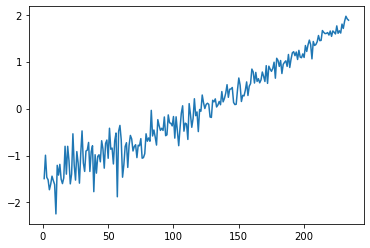

----------------MachineID-21----------------


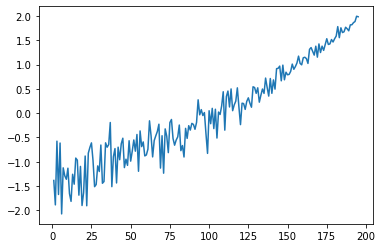

----------------MachineID-22----------------


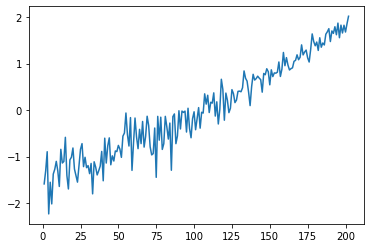

----------------MachineID-23----------------


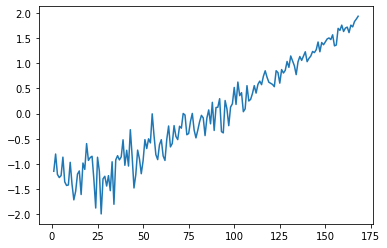

----------------MachineID-24----------------


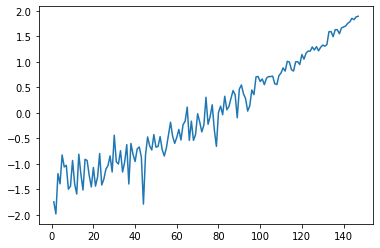

----------------MachineID-25----------------


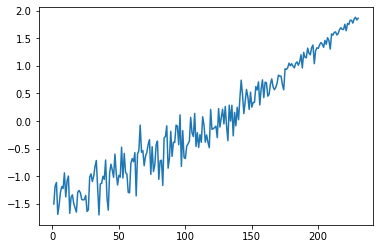

----------------MachineID-26----------------


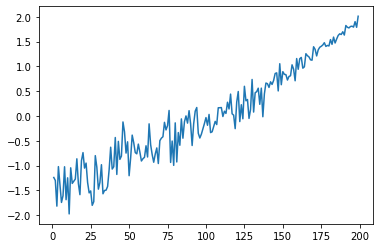

----------------MachineID-27----------------


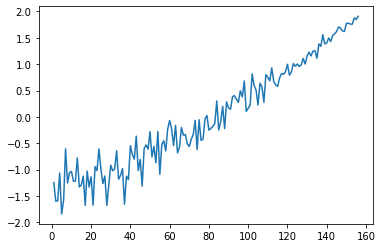

----------------MachineID-28----------------


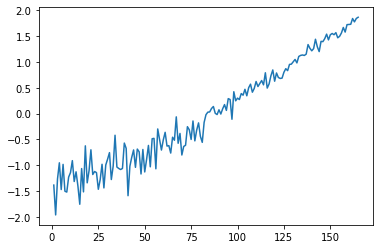

----------------MachineID-29----------------


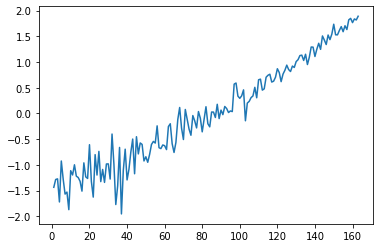

----------------MachineID-30----------------


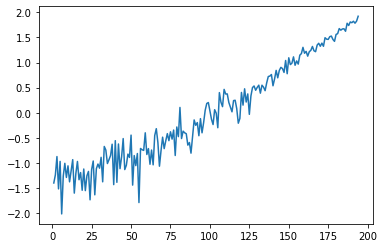

----------------MachineID-31----------------


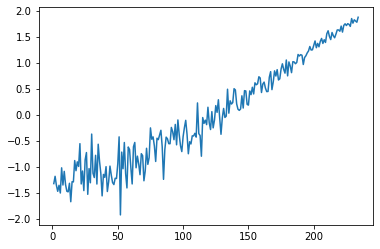

----------------MachineID-32----------------


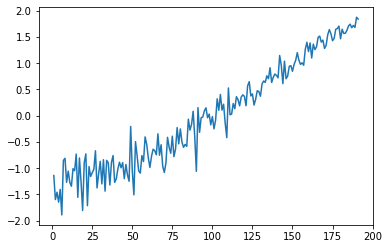

----------------MachineID-33----------------


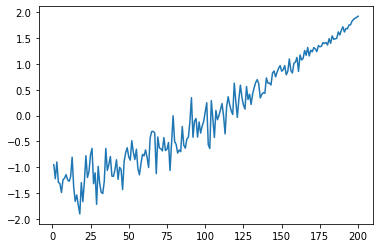

----------------MachineID-34----------------


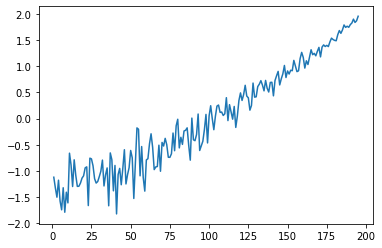

----------------MachineID-35----------------


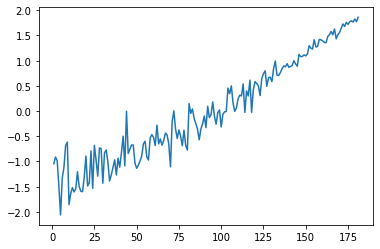

----------------MachineID-36----------------


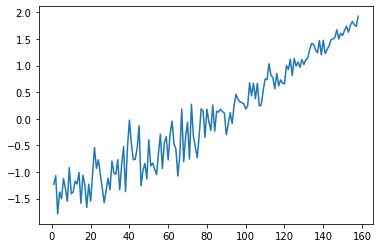

----------------MachineID-37----------------


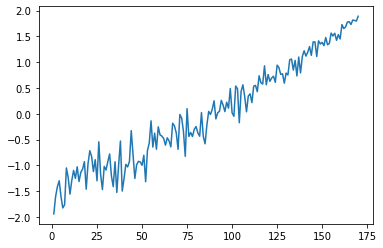

----------------MachineID-38----------------


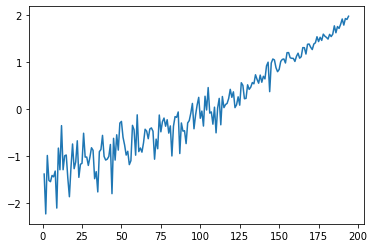

----------------MachineID-39----------------


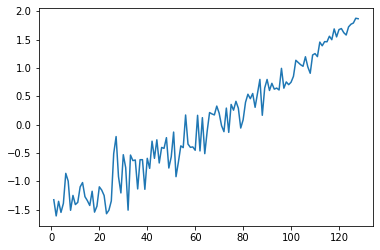

----------------MachineID-40----------------


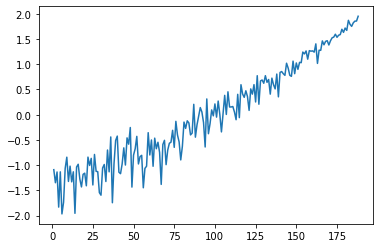

----------------MachineID-41----------------


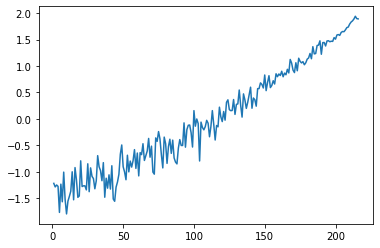

----------------MachineID-42----------------


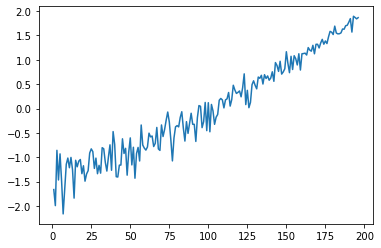

----------------MachineID-43----------------


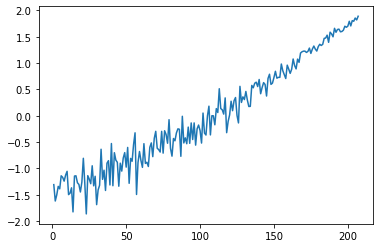

----------------MachineID-44----------------


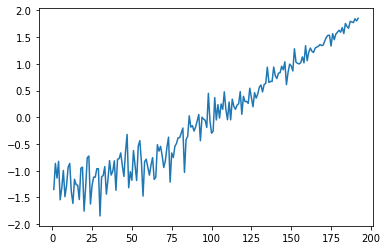

----------------MachineID-45----------------


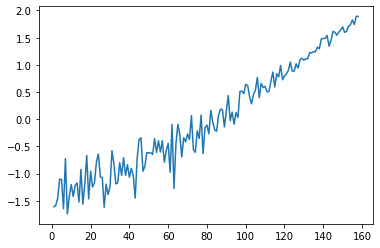

----------------MachineID-46----------------


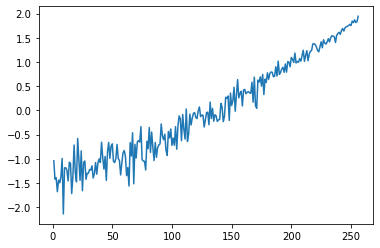

----------------MachineID-47----------------


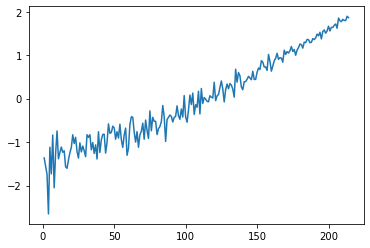

----------------MachineID-48----------------


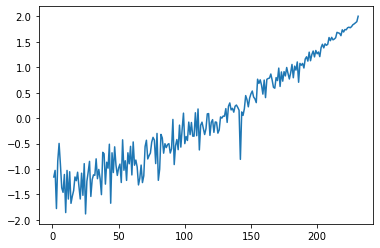

----------------MachineID-49----------------


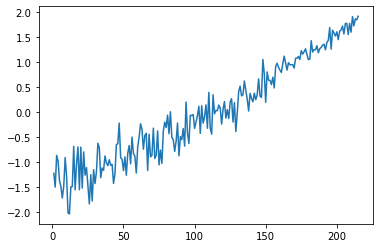

----------------MachineID-50----------------


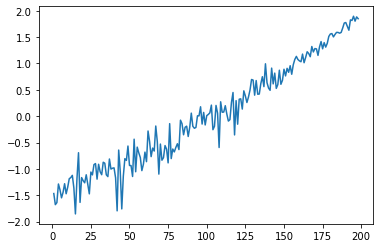

----------------MachineID-51----------------


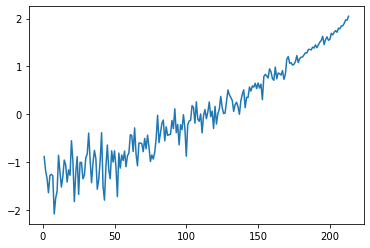

----------------MachineID-52----------------


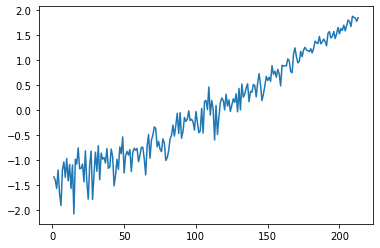

----------------MachineID-53----------------


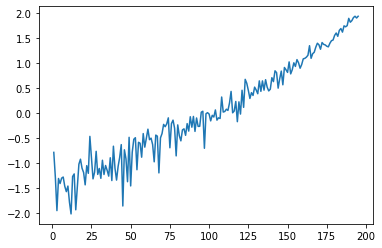

----------------MachineID-54----------------


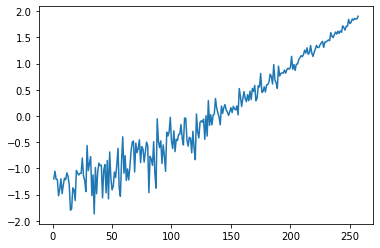

----------------MachineID-55----------------


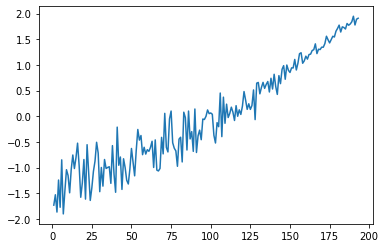

----------------MachineID-56----------------


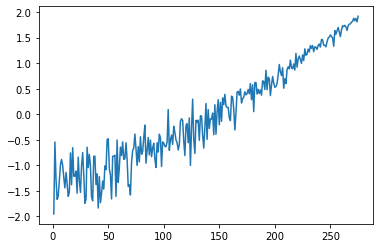

----------------MachineID-57----------------


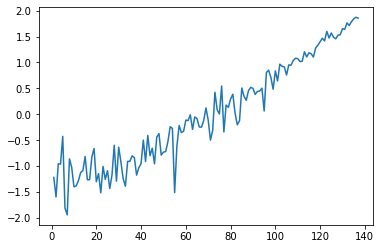

----------------MachineID-58----------------


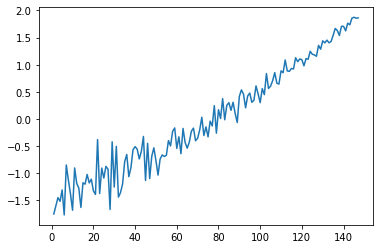

----------------MachineID-59----------------


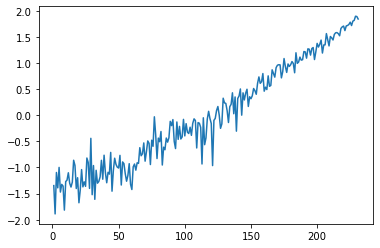

----------------MachineID-60----------------


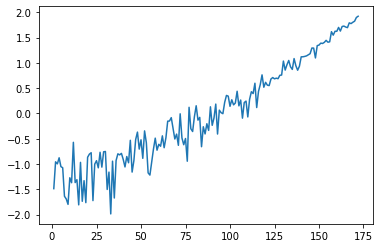

----------------MachineID-61----------------


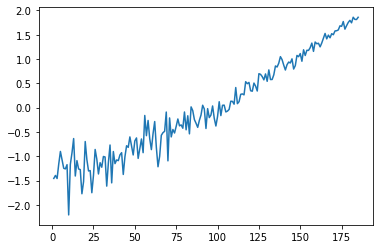

----------------MachineID-62----------------


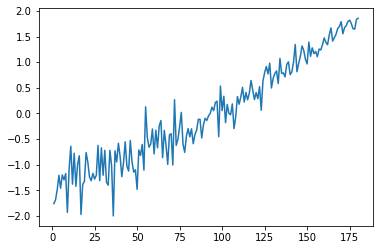

----------------MachineID-63----------------


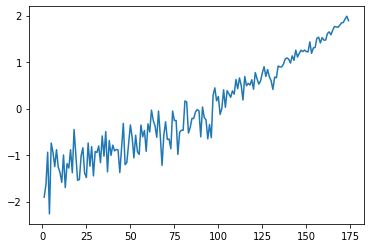

----------------MachineID-64----------------


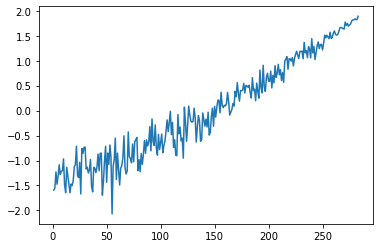

----------------MachineID-65----------------


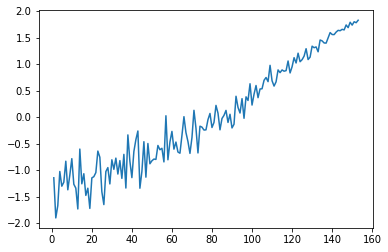

----------------MachineID-66----------------


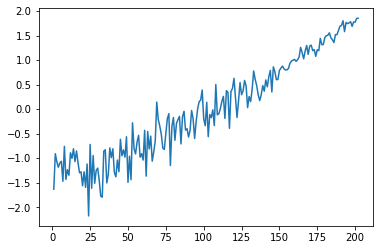

----------------MachineID-67----------------


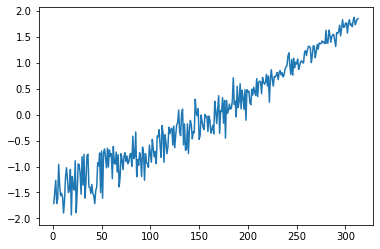

----------------MachineID-68----------------


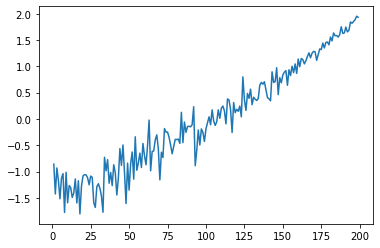

----------------MachineID-69----------------


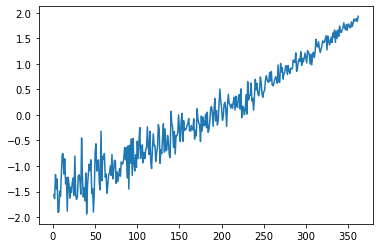

----------------MachineID-70----------------


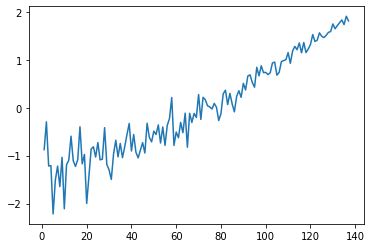

----------------MachineID-71----------------


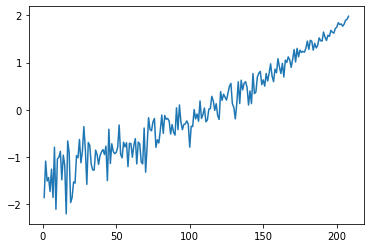

----------------MachineID-72----------------


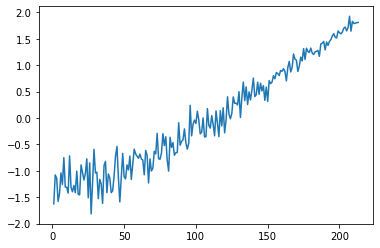

----------------MachineID-73----------------


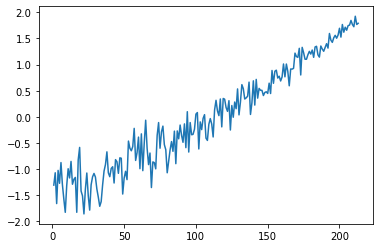

----------------MachineID-74----------------


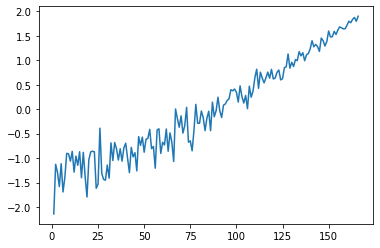

----------------MachineID-75----------------


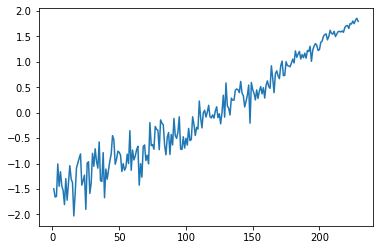

----------------MachineID-76----------------


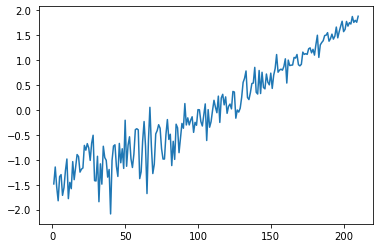

----------------MachineID-77----------------


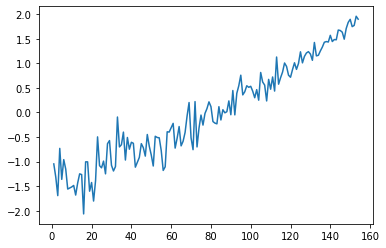

----------------MachineID-78----------------


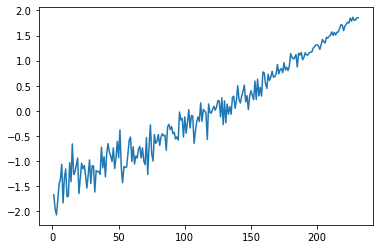

----------------MachineID-79----------------


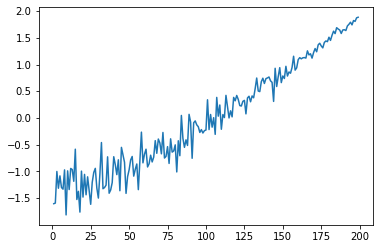

----------------MachineID-80----------------


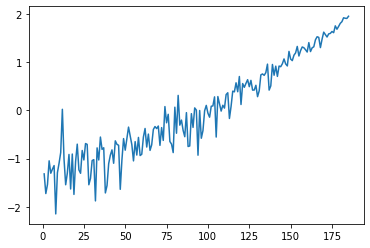

----------------MachineID-81----------------


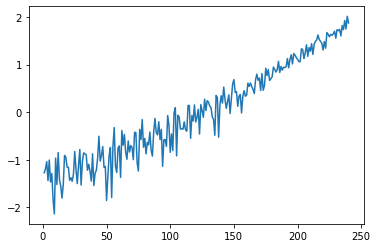

----------------MachineID-82----------------


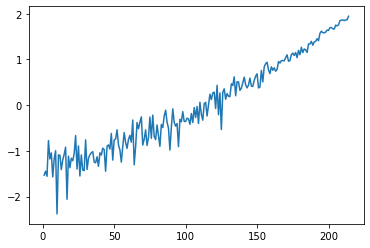

----------------MachineID-83----------------


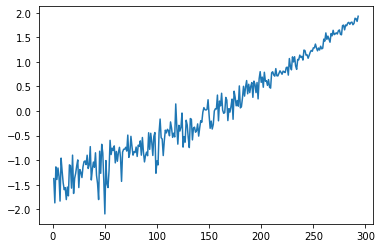

----------------MachineID-84----------------


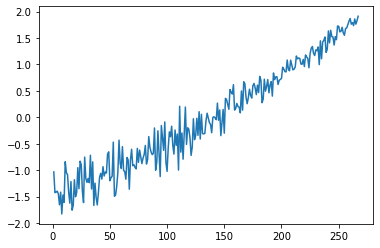

----------------MachineID-85----------------


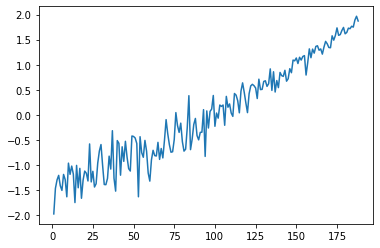

----------------MachineID-86----------------


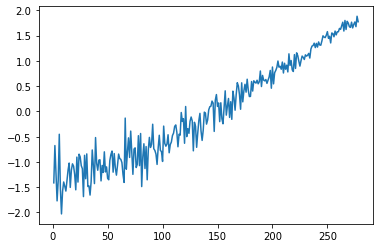

----------------MachineID-87----------------


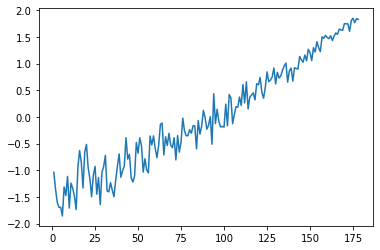

----------------MachineID-88----------------


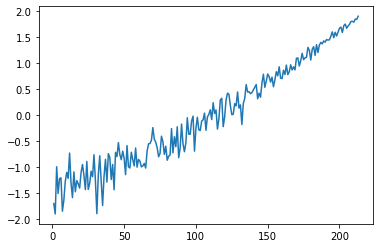

----------------MachineID-89----------------


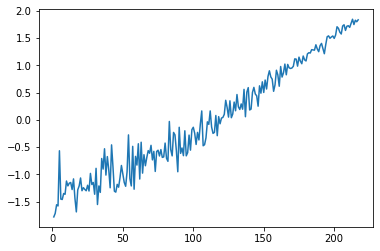

----------------MachineID-90----------------


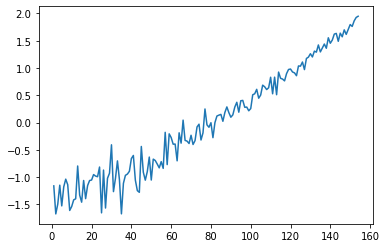

----------------MachineID-91----------------


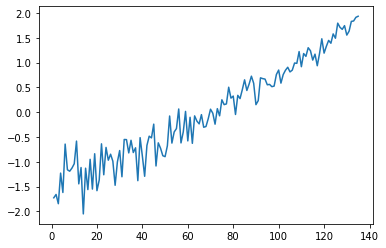

----------------MachineID-92----------------


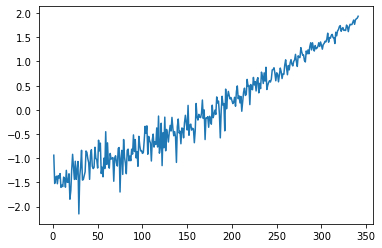

----------------MachineID-93----------------


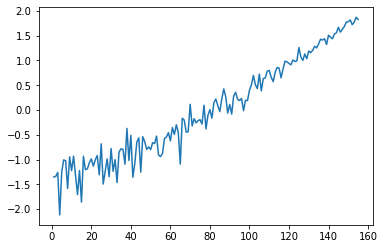

----------------MachineID-94----------------


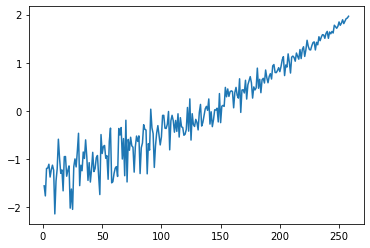

----------------MachineID-95----------------


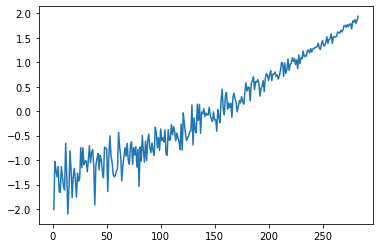

----------------MachineID-96----------------


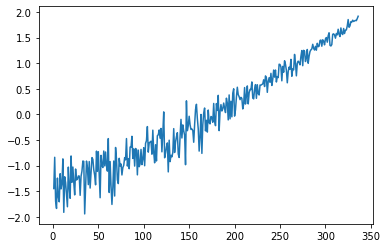

----------------MachineID-97----------------


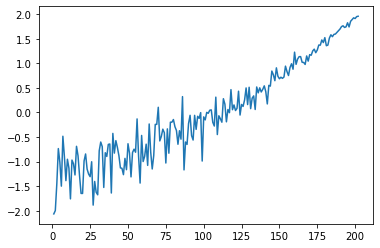

----------------MachineID-98----------------


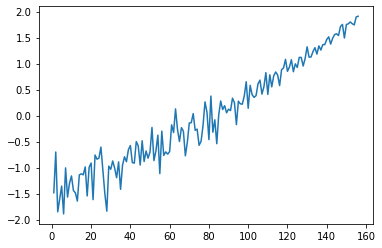

----------------MachineID-99----------------


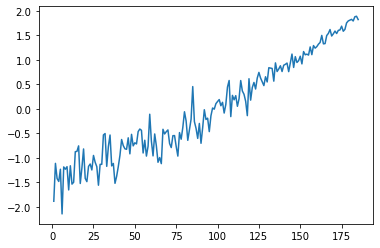

----------------MachineID-100----------------


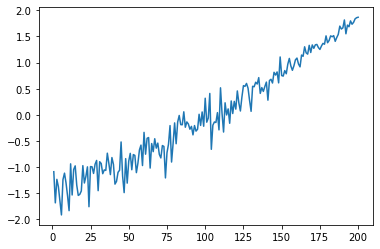

In [30]:
# APPLYING PCA WITH RESPECT TO THERE MID DATA
def data_processing(dataframe, grp_mid_series):
    pca_data = grouping(dataframe, grp_mid_series)
    process_lst_of_lst =[]
    jk =1
    for i in pca_data:
        dfs = i[1] 

        time = dfs["Section-1"]
        data = method_PCA(dfs)

        print("----------------MachineID-{}----------------".format(jk))

        data = transform_data(data)
        process_lst_of_lst.append(data)

        plt.plot(time, data)
        plt.show()

        jk = jk+1
    return process_lst_of_lst

process_lst_of_lst = data_processing(df, MachineID_series)

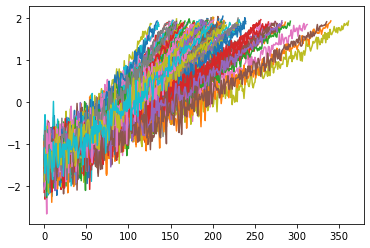

In [31]:
### Visulization of all 100 machine data all togther after applying PCA
for i in process_lst_of_lst:
    val = [j for j in range(len(i))]
    plt.plot(val,i)

In [32]:
process_data_lst = [j for i in process_lst_of_lst for j in i.reshape(1,-1)[0]]
process_df = pd.DataFrame({"MID":MachineID_series, 'data':process_data_lst, 'rul':list(RUL_df()["rul"])})
process_df.head()

,MID,data,rul
0,1,-1.396425,192
1,1,-0.906658,191
2,1,-1.359991,190
3,1,-1.681644,189
4,1,-1.124620,188


### Model Making

In [33]:
train_X , test_X , train_y , test_y = train_test_split(process_df['data'], process_df['rul'] , test_size = 0.01)

In [34]:
# Making data according to model input requirements:
trainX, trainY = reshaping(train_X, train_y)
testX, testY = reshaping(test_X, test_y)

# Examining
print(trainX.shape)
print(testX.shape)

(20424, 1, 1)
(207, 1, 1)


In [35]:
look_back = 1
# Model
model = Sequential()
model.add(LSTM(50, input_shape=(1, look_back)))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mae', 'mse'])

In [36]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 50)                10400     
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 51        
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________


In [37]:
history = model.fit(trainX, trainY, epochs=5, batch_size=16, validation_data=(testX, testY))

Train on 20424 samples, validate on 207 samples
Epoch 1/5
20424/20424 [==============================] - 3s 145us/step - loss: 11846.1406 - mae: 89.7943 - mse: 11846.1445 - val_loss: 6463.1608 - val_mae: 62.9509 - val_mse: 6463.1602
Epoch 2/5
20424/20424 [==============================] - 3s 128us/step - loss: 4367.7443 - mae: 46.1255 - mse: 4367.7397 - val_loss: 2653.1950 - val_mae: 33.3635 - val_mse: 2653.1951
Epoch 3/5
20424/20424 [==============================] - 3s 123us/step - loss: 2177.1810 - mae: 30.5471 - mse: 2177.1807 - val_loss: 1727.1467 - val_mae: 28.3748 - val_mse: 1727.1467
Epoch 4/5
20424/20424 [==============================] - 3s 123us/step - loss: 1570.8596 - mae: 27.1163 - mse: 1570.8601 - val_loss: 1427.9014 - val_mae: 26.1589 - val_mse: 1427.9014
Epoch 5/5
20424/20424 [==============================] - 3s 123us/step - loss: 1307.6750 - mae: 24.7002 - mse: 1307.6753 - val_loss: 1230.3037 - val_mae: 24.1338 - val_mse: 1230.3037


In [38]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,val_loss,val_mae,val_mse,loss,mae,mse,epoch
0,6463.160791,62.950916,6463.160156,11846.140588,89.794350,11846.144531,0
1,2653.194991,33.363495,2653.195068,4367.744317,46.125469,4367.739746,1
2,1727.146710,28.374752,1727.146729,2177.181011,30.547148,2177.180664,2
3,1427.901439,26.158949,1427.901367,1570.859571,27.116331,1570.860107,3
4,1230.303745,24.133846,1230.303711,1307.675012,24.700180,1307.675293,4


In [39]:
print(history.history.keys())

dict_keys(['val_loss', 'val_mae', 'val_mse', 'loss', 'mae', 'mse'])


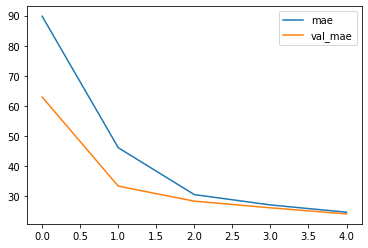

In [40]:
plt.plot(history.epoch, history.history['mae'] , label="mae")
plt.plot(history.epoch, history.history['val_mae'] , label = "val_mae")
plt.legend()
plt.show()

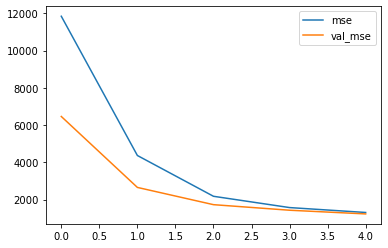

In [41]:
plt.plot(history.epoch, history.history['mse'] , label="mse")
plt.plot(history.epoch, history.history['val_mse'] , label = "val_mse")
plt.legend()
plt.show()

207
207


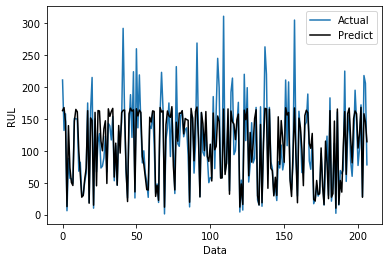

In [42]:
print(len(testY))
print(len(testX))

plt.plot(testY, label = "Actual")
plt.xlabel("Data");plt.ylabel("RUL")
val = model.predict(testX)
plst = [i[0] for i in val]
plt.plot(plst, c='k', label="Predict")
plt.legend();plt.show()

### Now, implementing linear regrssion on PCA dataset

In [43]:
process_df.head()

,MID,data,rul
0,1,-1.396425,192
1,1,-0.906658,191
2,1,-1.359991,190
3,1,-1.681644,189
4,1,-1.124620,188


In [44]:
from sklearn.linear_model import LinearRegression
X = np.array(process_df['data']).reshape(-1,1)

y = np.array(process_df['rul']).reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20) 

reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [45]:
## Accuracy of Linear Regression
print("Acc of lR >> ",reg.score(X_test, y_test))

Acc of lR >>  0.783725726730395


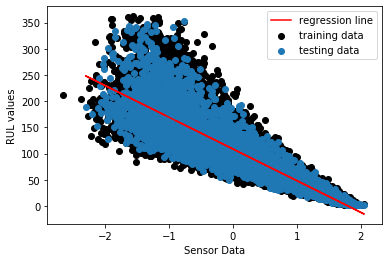

In [46]:
plt.scatter(X_train, y_train, c='k', label='training data')
plt.scatter(X_test, y_test, label='testing data') 
pred = reg.predict(X_test)
plt.plot(X_test, pred, c='r' , label='regression line')
plt.xlabel("Sensor Data"); plt.ylabel("RUL values")
plt.legend()
plt.show()

MID-1
acc at MID-1 >>  0.870421132856352


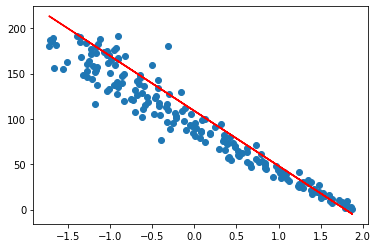

MID-2
acc at MID-2 >>  0.7121470834487085


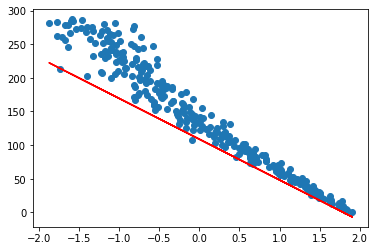

MID-3
acc at MID-3 >>  0.7601510071838146


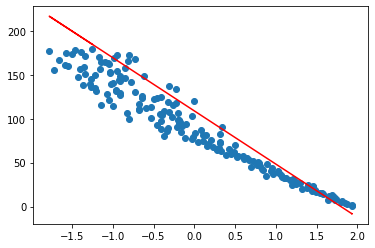

MID-4
acc at MID-4 >>  0.8274018012872426


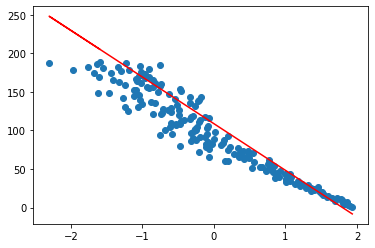

MID-5
acc at MID-5 >>  0.7981828905553491


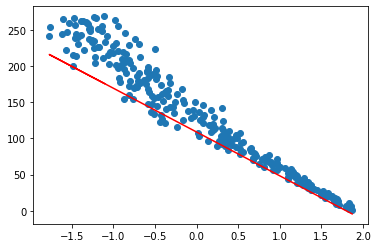

MID-6
acc at MID-6 >>  0.8468331905148412


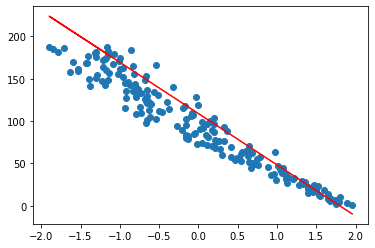

MID-7
acc at MID-7 >>  0.8305359710619672


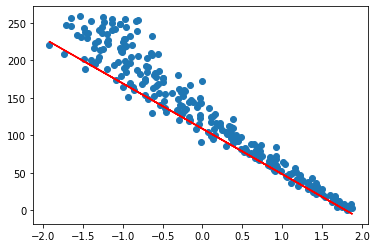

MID-8
acc at MID-8 >>  0.1270027582671549


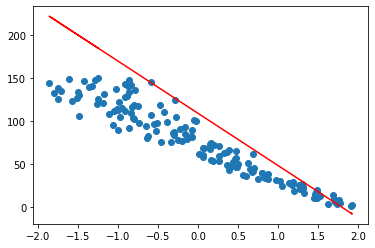

MID-9
acc at MID-9 >>  0.9321176363864958


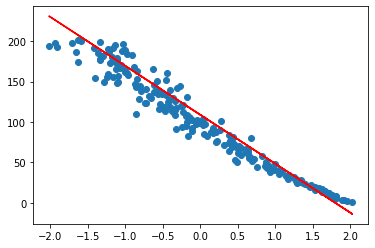

MID-10
acc at MID-10 >>  0.9586969673336129


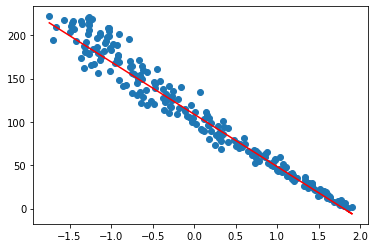

MID-11
acc at MID-11 >>  0.9088686116818875


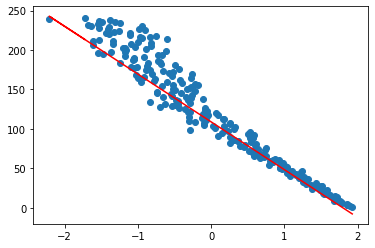

MID-12
acc at MID-12 >>  0.6294073342633724


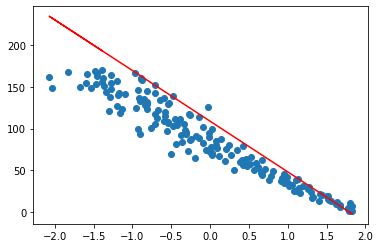

MID-13
acc at MID-13 >>  0.4867588238997635


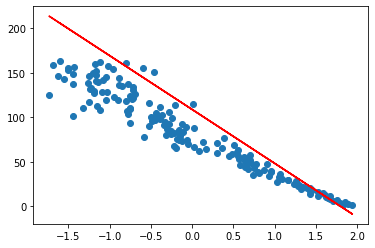

MID-14
acc at MID-14 >>  0.7748683523780451


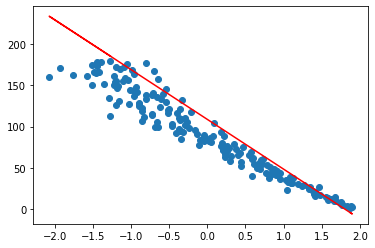

MID-15
acc at MID-15 >>  0.9407049306769734


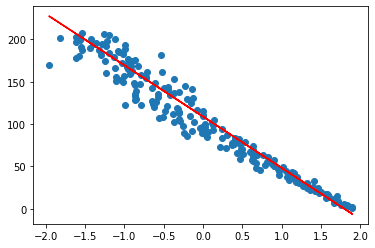

MID-16
acc at MID-16 >>  0.9123842844237549


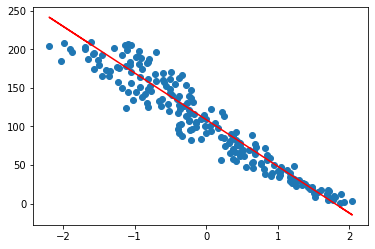

MID-17
acc at MID-17 >>  0.7680120432323587


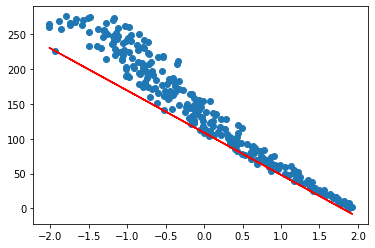

MID-18
acc at MID-18 >>  0.8791886643845584


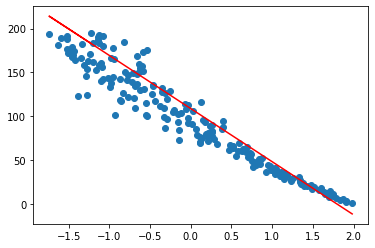

MID-19
acc at MID-19 >>  0.3762982298764347


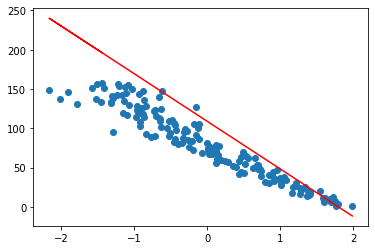

MID-20
acc at MID-20 >>  0.9173596409370619


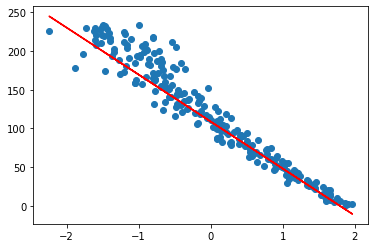

MID-21
acc at MID-21 >>  0.8596353256539666


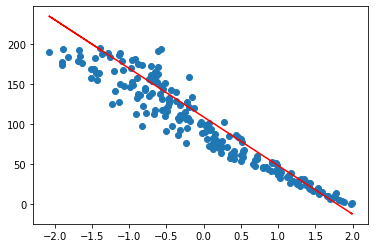

MID-22
acc at MID-22 >>  0.8988929398646942


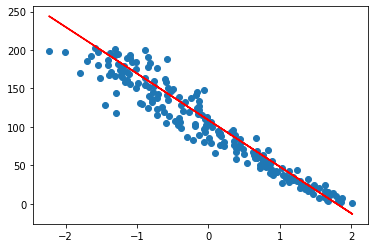

MID-23
acc at MID-23 >>  0.5956159659907817


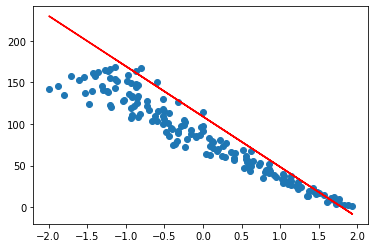

MID-24
acc at MID-24 >>  0.057608266539991515


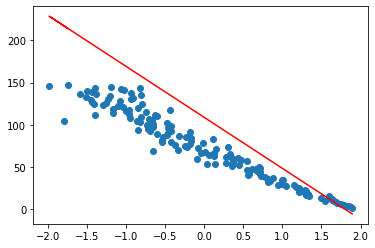

MID-25
acc at MID-25 >>  0.9267737861817332


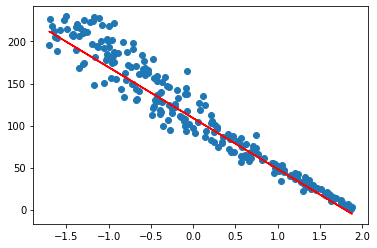

MID-26
acc at MID-26 >>  0.8957343778266847


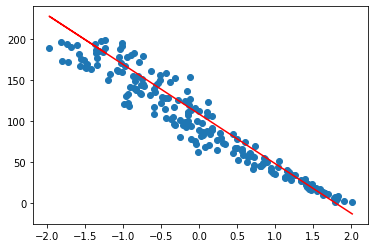

MID-27
acc at MID-27 >>  0.34106694657762804


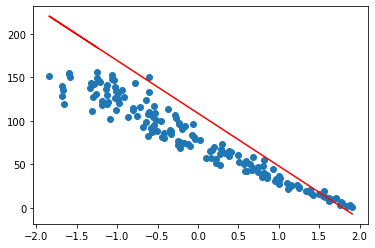

MID-28
acc at MID-28 >>  0.5666602420152784


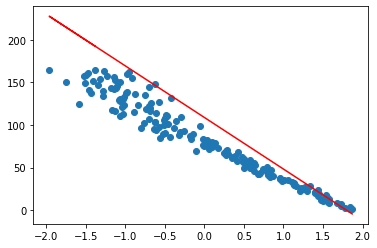

MID-29
acc at MID-29 >>  0.5173004334209794


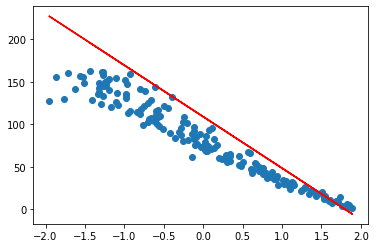

MID-30
acc at MID-30 >>  0.881533930043041


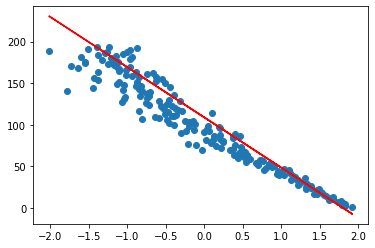

MID-31
acc at MID-31 >>  0.9124740203951932


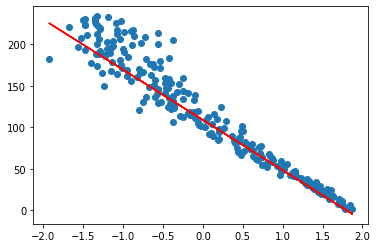

MID-32
acc at MID-32 >>  0.8598639348537406


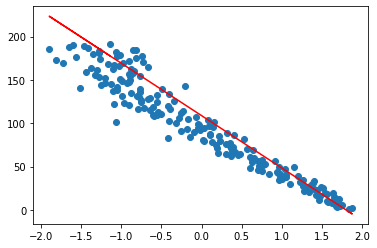

MID-33
acc at MID-33 >>  0.9106436007769474


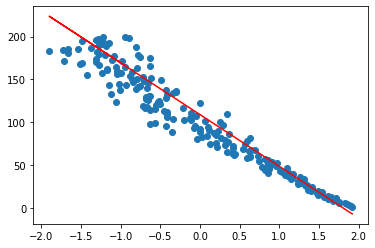

MID-34
acc at MID-34 >>  0.8828240629070563


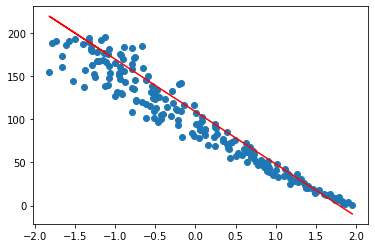

MID-35
acc at MID-35 >>  0.7785261291027762


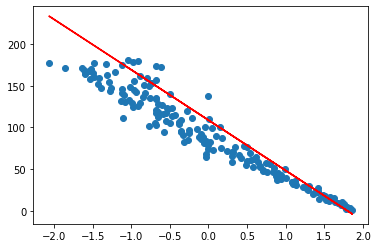

MID-36
acc at MID-36 >>  0.3786628823465997


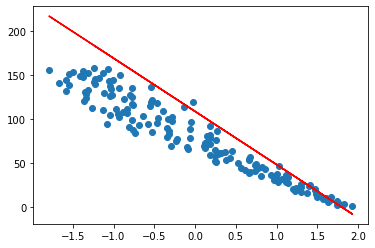

MID-37
acc at MID-37 >>  0.6499265745676461


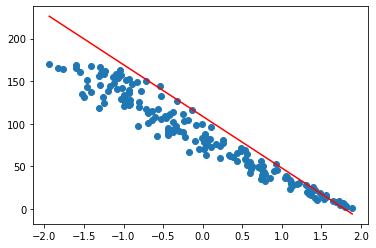

MID-38
acc at MID-38 >>  0.8601296477460186


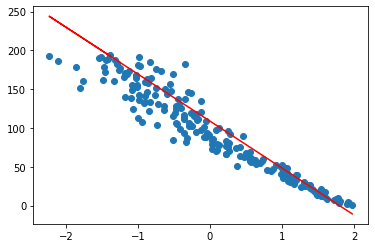

MID-39
acc at MID-39 >>  -0.9490233093514427


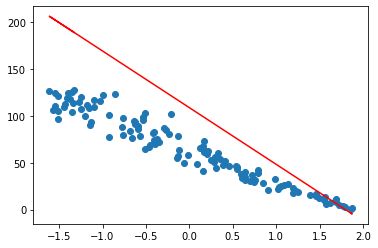

MID-40
acc at MID-40 >>  0.8318745502490484


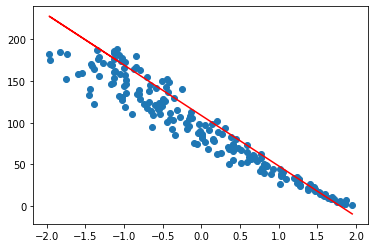

MID-41
acc at MID-41 >>  0.9530724860077479


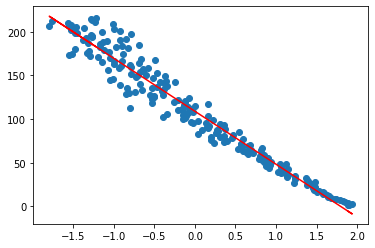

MID-42
acc at MID-42 >>  0.9012594770158007


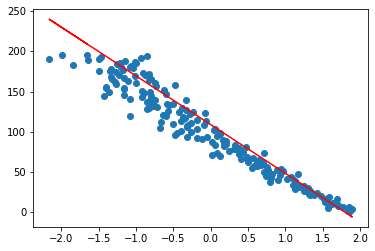

MID-43
acc at MID-43 >>  0.9429637683149044


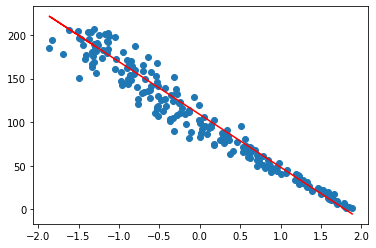

MID-44
acc at MID-44 >>  0.8662572098765675


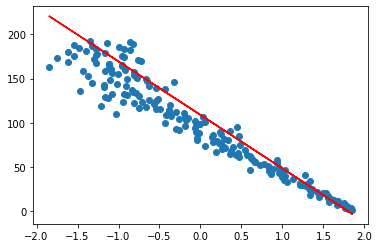

MID-45
acc at MID-45 >>  0.4003681730684728


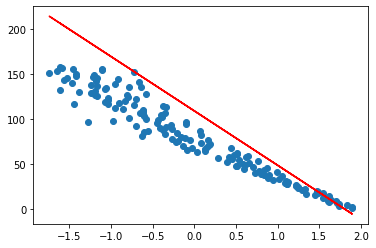

MID-46
acc at MID-46 >>  0.8510747654794925


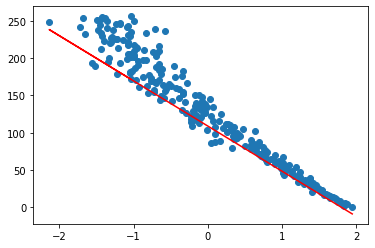

MID-47
acc at MID-47 >>  0.9479686469133187


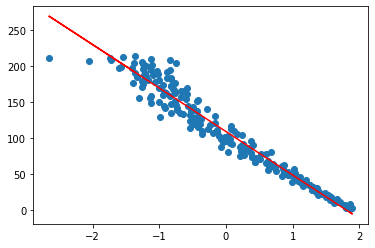

MID-48
acc at MID-48 >>  0.9129612320504144


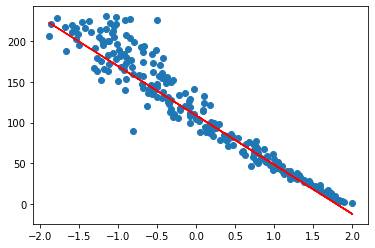

MID-49
acc at MID-49 >>  0.9246684657958804


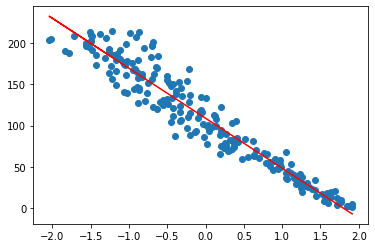

MID-50
acc at MID-50 >>  0.9167332716657202


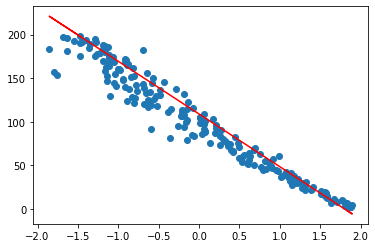

MID-51
acc at MID-51 >>  0.9294127122492764


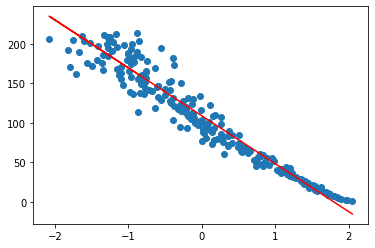

MID-52
acc at MID-52 >>  0.9423572962570814


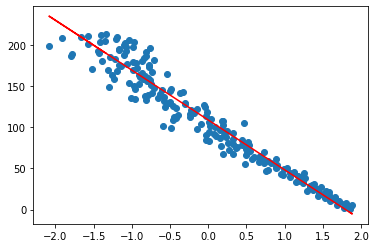

MID-53
acc at MID-53 >>  0.8928264973354467


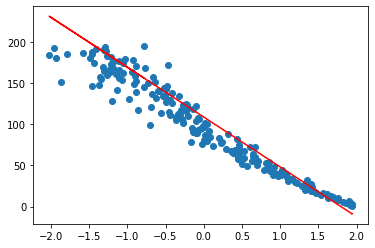

MID-54
acc at MID-54 >>  0.8417857779787004


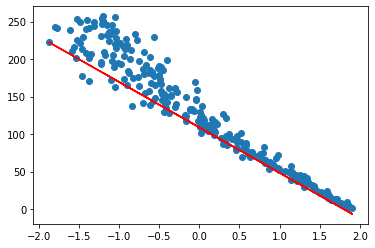

MID-55
acc at MID-55 >>  0.849465807572422


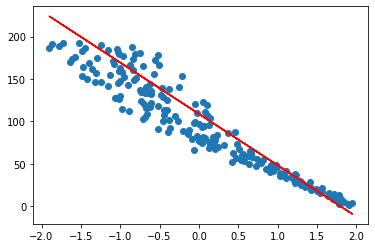

MID-56
acc at MID-56 >>  0.7474958539278671


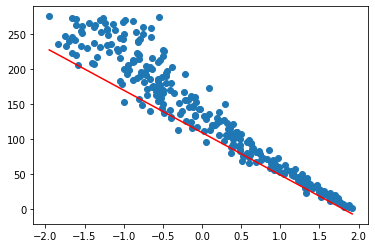

MID-57
acc at MID-57 >>  -0.4184181971017873


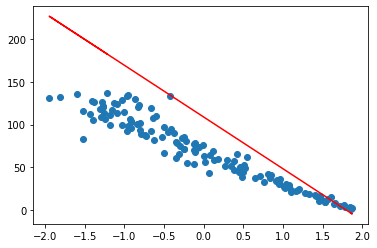

MID-58
acc at MID-58 >>  0.06807770693707493


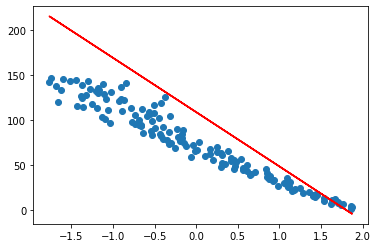

MID-59
acc at MID-59 >>  0.9293393995927589


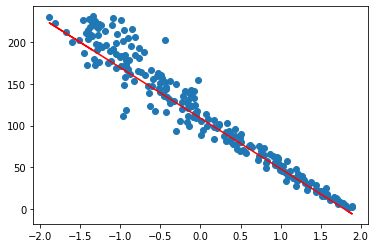

MID-60
acc at MID-60 >>  0.6553141222363018


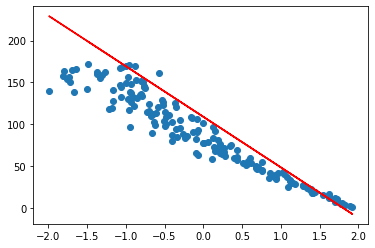

MID-61
acc at MID-61 >>  0.828631596306367


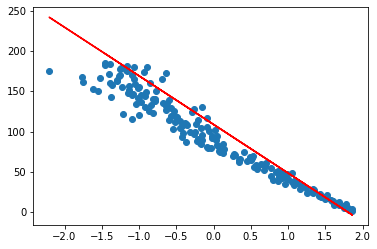

MID-62
acc at MID-62 >>  0.754797215998816


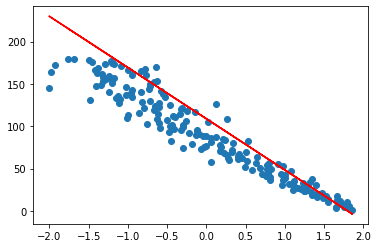

MID-63
acc at MID-63 >>  0.6720267421706028


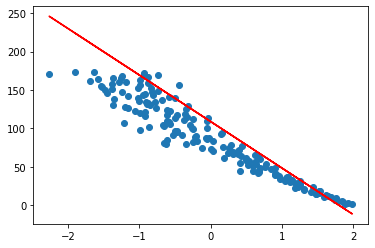

MID-64
acc at MID-64 >>  0.7223616178164424


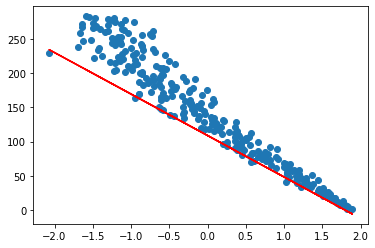

MID-65
acc at MID-65 >>  0.24767992324555957


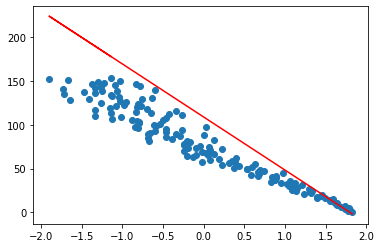

MID-66
acc at MID-66 >>  0.8948988662622434


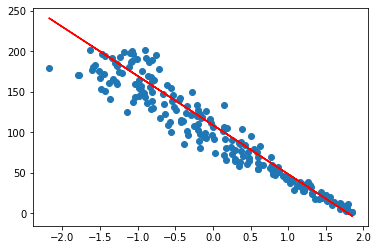

MID-67
acc at MID-67 >>  0.569662080640988


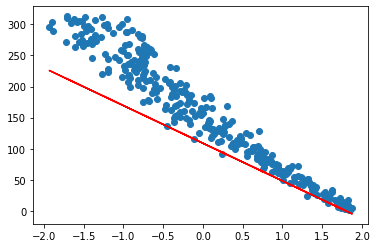

MID-68
acc at MID-68 >>  0.9083993770896605


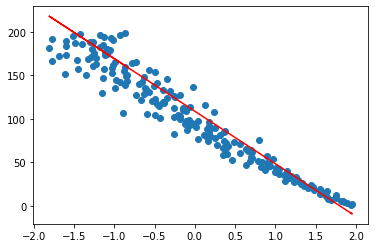

MID-69
acc at MID-69 >>  0.3074898925517554


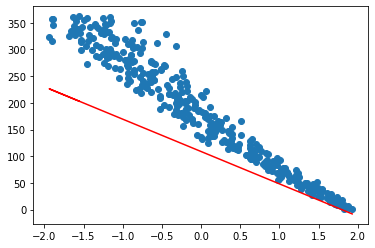

MID-70
acc at MID-70 >>  -0.4400903388002029


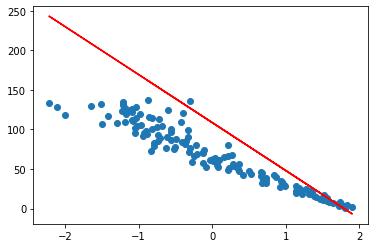

MID-71
acc at MID-71 >>  0.914742955077847


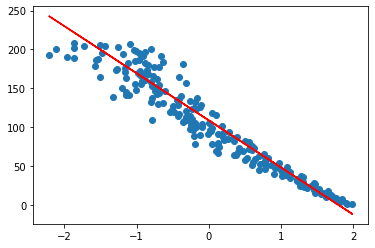

MID-72
acc at MID-72 >>  0.9402484264483557


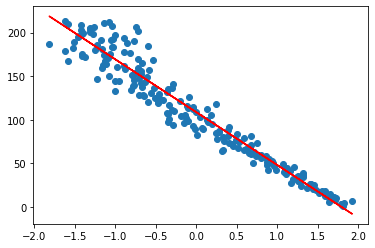

MID-73
acc at MID-73 >>  0.9296750876430651


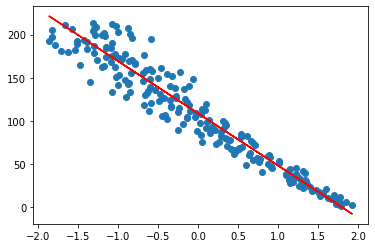

MID-74
acc at MID-74 >>  0.5628031306893567


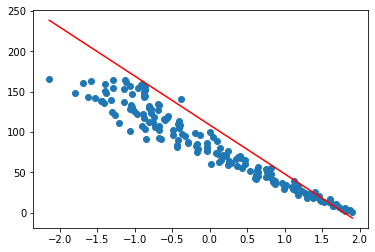

MID-75
acc at MID-75 >>  0.931428292105736


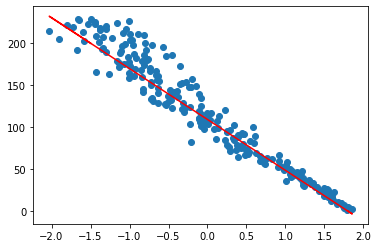

MID-76
acc at MID-76 >>  0.9113005565562657


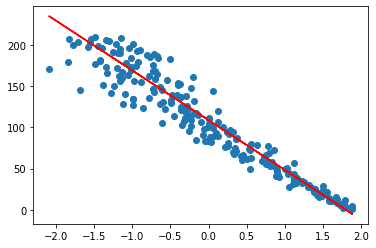

MID-77
acc at MID-77 >>  0.26818871181033244


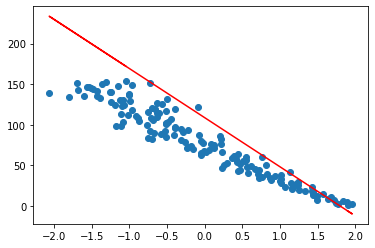

MID-78
acc at MID-78 >>  0.9387137370005627


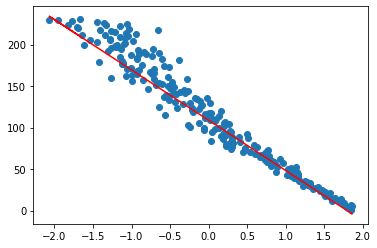

MID-79
acc at MID-79 >>  0.912652215170594


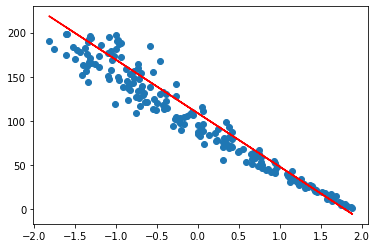

MID-80
acc at MID-80 >>  0.7840454956948656


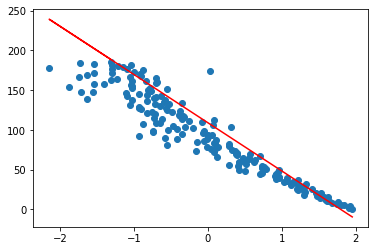

MID-81
acc at MID-81 >>  0.8932122793895234


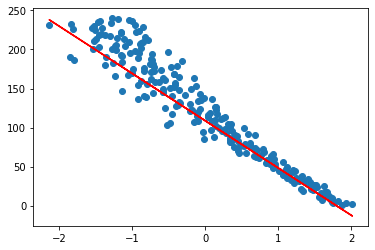

MID-82
acc at MID-82 >>  0.9386904672673864


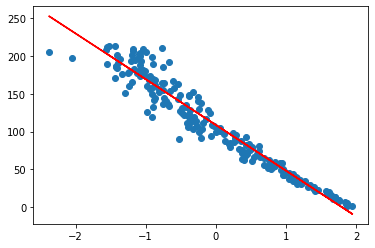

MID-83
acc at MID-83 >>  0.6778467344090809


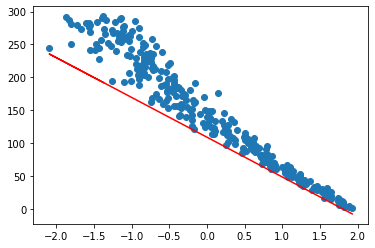

MID-84
acc at MID-84 >>  0.8029856775564496


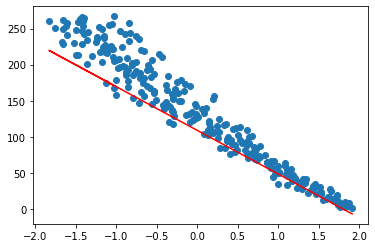

MID-85
acc at MID-85 >>  0.8374966270813585


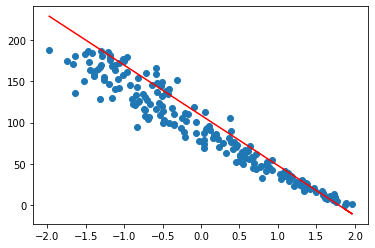

MID-86
acc at MID-86 >>  0.7457573865601184


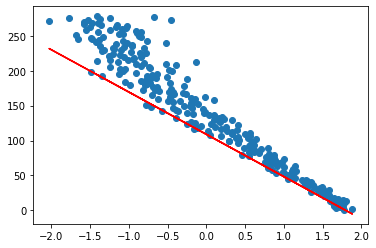

MID-87
acc at MID-87 >>  0.7561161738737106


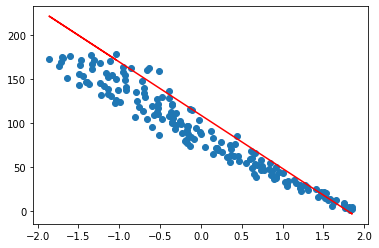

MID-88
acc at MID-88 >>  0.9496636400954483


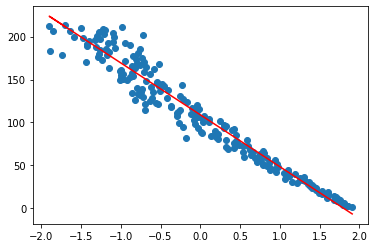

MID-89
acc at MID-89 >>  0.9493988890387263


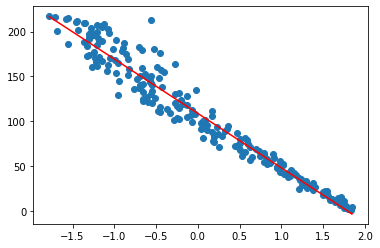

MID-90
acc at MID-90 >>  0.305902027405374


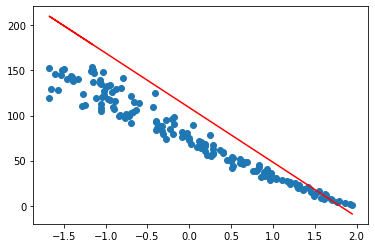

MID-91
acc at MID-91 >>  -0.5134009544412117


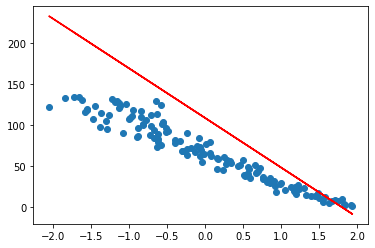

MID-92
acc at MID-92 >>  0.42259674914107925


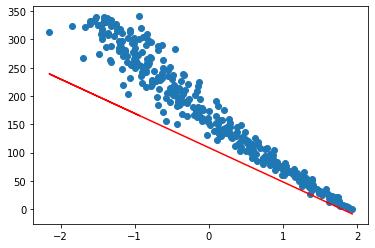

MID-93
acc at MID-93 >>  0.32677212747768636


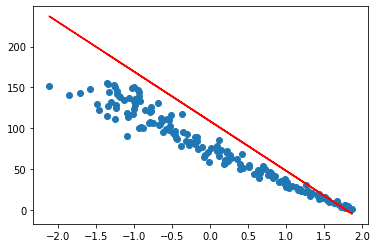

MID-94
acc at MID-94 >>  0.8217100738091886


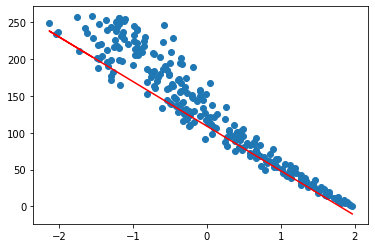

MID-95
acc at MID-95 >>  0.7248962670318378


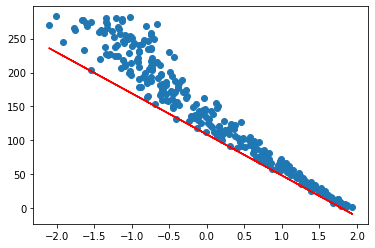

MID-96
acc at MID-96 >>  0.44363393743687185


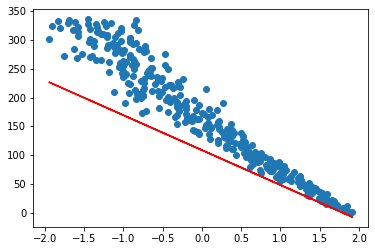

MID-97
acc at MID-97 >>  0.8791590002884871


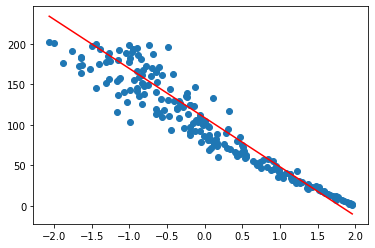

MID-98
acc at MID-98 >>  0.34457899022013594


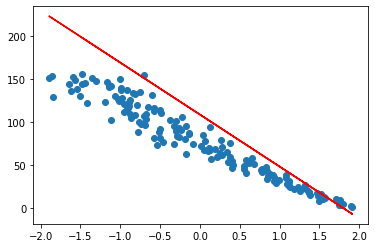

MID-99
acc at MID-99 >>  0.8187703932781344


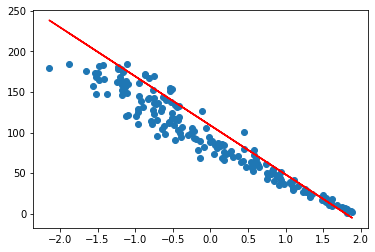

MID-100
acc at MID-100 >>  0.9224510888202598


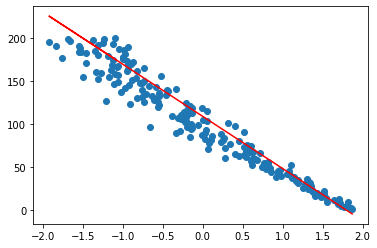

In [47]:
# Now, trying to check this in all machine-id
def graphs(model_instance):
    for i in range(1,101):
        dataset = process_df.groupby('MID').get_group(i)
        print("MID-{}".format(i));
        testX = np.array(dataset['data']).reshape(-1,1)
        testy = np.array(dataset['rul']).reshape(-1,1)

        # score
        print("acc at MID-{} >> ".format(i), model_instance.score(testX, testy))

        # graph
        pred = model_instance.predict(testX)
        plt.scatter(testX, testy) 
        plt.plot(testX, pred, c='r')
        plt.show()

graphs(reg)

In [48]:
print("R2 Score >>", r2_score(y_test, pred))
print("explained_variance_score >> ", explained_variance_score(y_test, pred))
print("mean_squared_error >> ", mean_squared_error(y_test, pred))
print("mean_absolute_error >>",mean_absolute_error(y_test, pred))
# print('cv score >> ',cross_val_score(reg, testX, testy, cv=3))

R2 Score >> 0.783725726730395
explained_variance_score >>  0.7837292665580771
mean_squared_error >>  1026.59270027944
mean_absolute_error >> 22.471968587278717


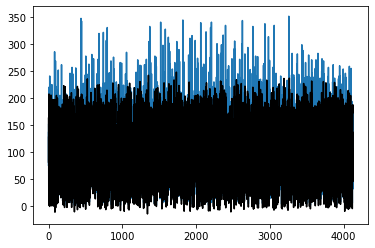

In [49]:
plt.plot(y_test)
plt.plot(pred,c='k')

### Now, implementing Dession tree regreesor on PCA dataset

In [50]:
# trying dession tree regreesor
from sklearn.tree import DecisionTreeRegressor

dt_reg = DecisionTreeRegressor()
dt_reg.fit(X_train, y_train)
print("acc of DTS >> ",dt_reg.score(X_test, y_test))

acc of DTS >>  0.5701760433638909


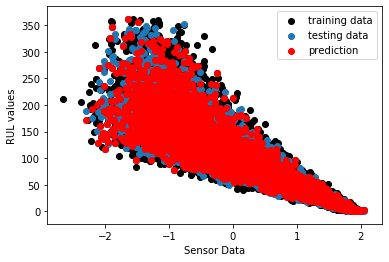

In [51]:
plt.scatter(X_train, y_train, c='k', label='training data')
plt.scatter(X_test, y_test, label='testing data') 
dt_pred = dt_reg.predict(X_test)
plt.scatter(X_test, dt_pred, c='r' , label='prediction')
plt.xlabel("Sensor Data"); plt.ylabel("RUL values")
plt.legend()
plt.show()

In [52]:
print("R2 Score >>", r2_score(y_test, dt_pred))
print("explained_variance_score >> ", explained_variance_score(y_test, dt_pred))
print("mean_squared_error >> ", mean_squared_error(y_test, dt_pred))
print("mean_absolute_error >>",mean_absolute_error(y_test, dt_pred))
# print('cv score >> ',cross_val_score(dt_reg, testX, testy, cv=3))

R2 Score >> 0.5701760433638909
explained_variance_score >>  0.5701821475871441
mean_squared_error >>  2040.2525442209837
mean_absolute_error >> 30.955052095953477


MID-1
acc at MID-1 >>  0.9031210156525513


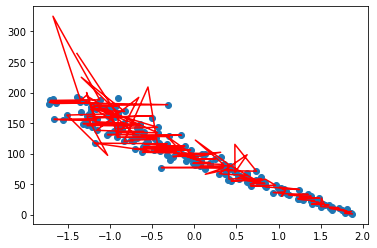

MID-2
acc at MID-2 >>  0.9086244040512333


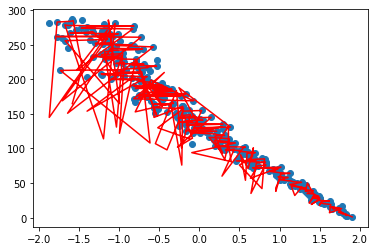

MID-3
acc at MID-3 >>  0.8607515744983575


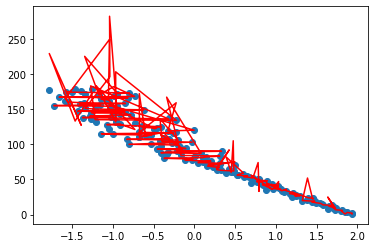

MID-4
acc at MID-4 >>  0.9065269556870901


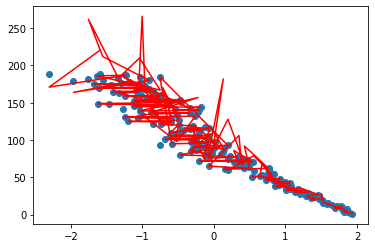

MID-5
acc at MID-5 >>  0.9382361735313519


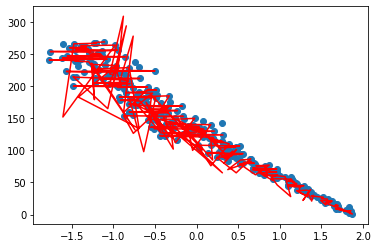

MID-6
acc at MID-6 >>  0.9158995642099522


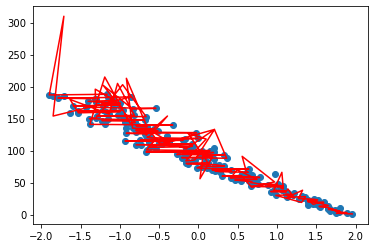

MID-7
acc at MID-7 >>  0.9449428792452048


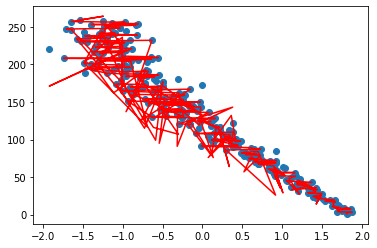

MID-8
acc at MID-8 >>  0.531211164940664


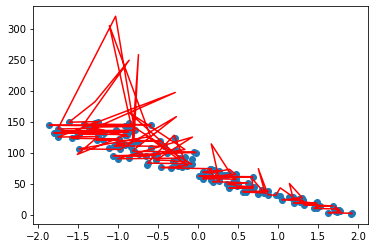

MID-9
acc at MID-9 >>  0.9377342249150288


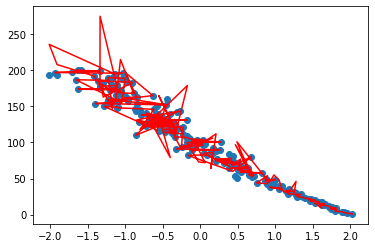

MID-10
acc at MID-10 >>  0.944786618487489


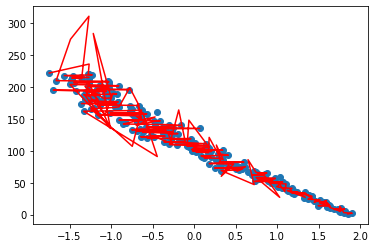

MID-11
acc at MID-11 >>  0.956072588065765


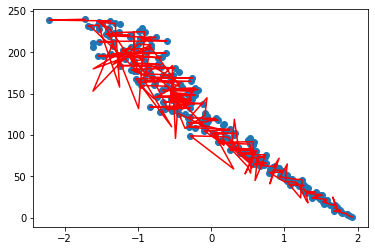

MID-12
acc at MID-12 >>  0.8224094869962933


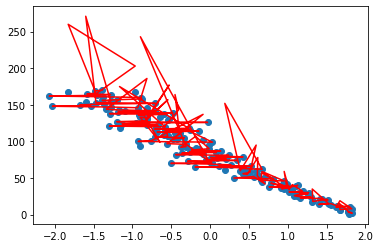

MID-13
acc at MID-13 >>  0.8459607295459458


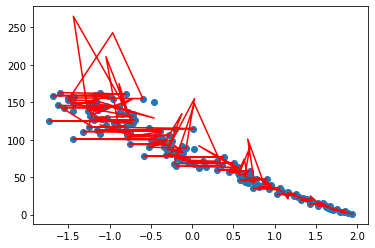

MID-14
acc at MID-14 >>  0.9102441433377574


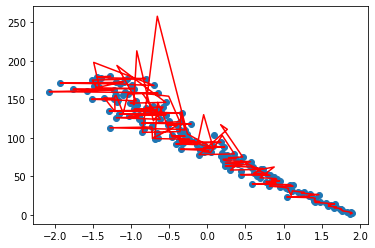

MID-15
acc at MID-15 >>  0.9803159939820978


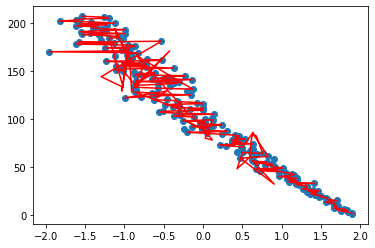

MID-16
acc at MID-16 >>  0.9229454755770545


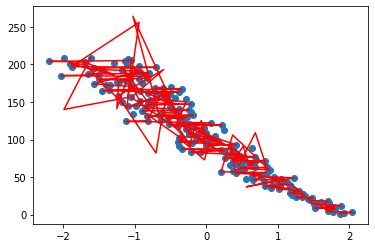

MID-17
acc at MID-17 >>  0.9261685763616386


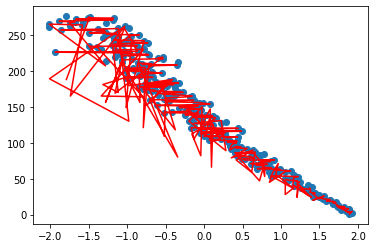

MID-18
acc at MID-18 >>  0.9446778552816845


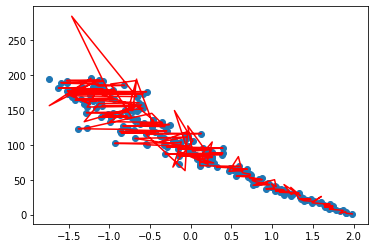

MID-19
acc at MID-19 >>  0.8552602154986849


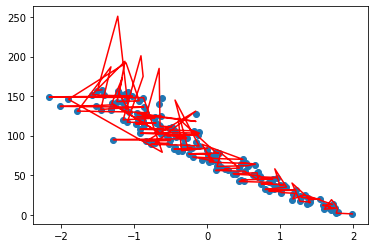

MID-20
acc at MID-20 >>  0.9644336426365465


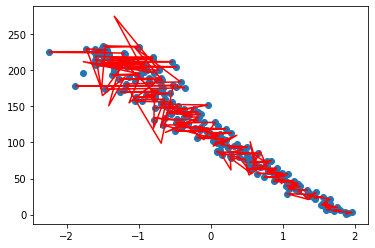

MID-21
acc at MID-21 >>  0.9209025878392594


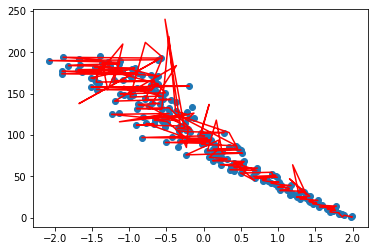

MID-22
acc at MID-22 >>  0.876334078522182


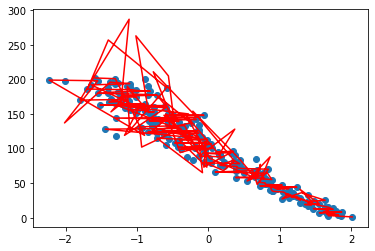

MID-23
acc at MID-23 >>  0.7373513750183486


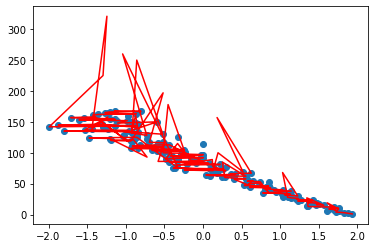

MID-24
acc at MID-24 >>  0.7085168758358582


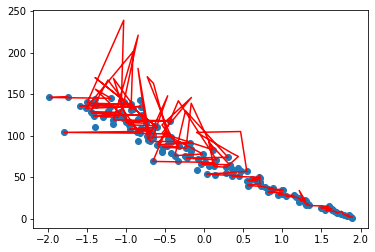

MID-25
acc at MID-25 >>  0.9444864988817904


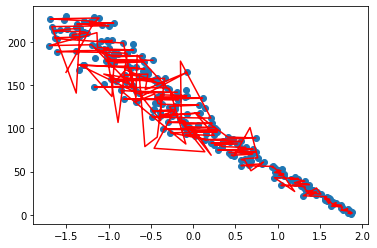

MID-26
acc at MID-26 >>  0.9446505253540429


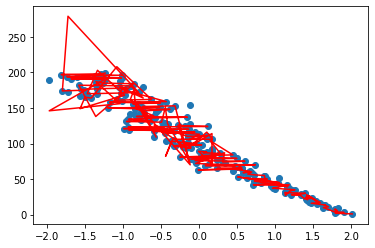

MID-27
acc at MID-27 >>  0.8641620963790678


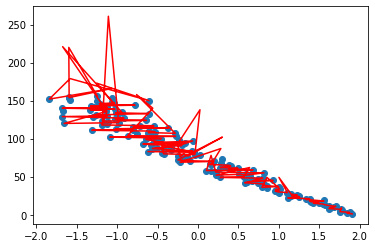

MID-28
acc at MID-28 >>  0.9433761654155425


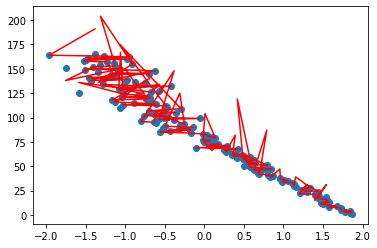

MID-29
acc at MID-29 >>  0.701763318757932


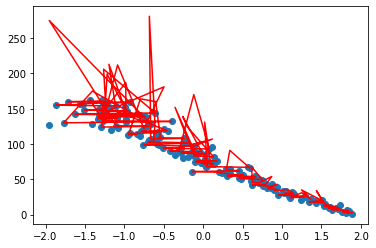

MID-30
acc at MID-30 >>  0.9462384898900043


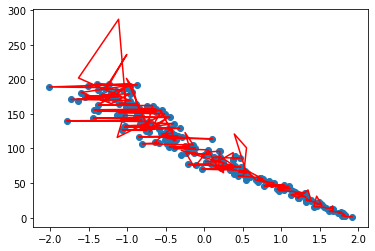

MID-31
acc at MID-31 >>  0.9380073005860605


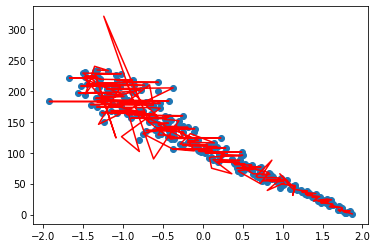

MID-32
acc at MID-32 >>  0.8470463626343345


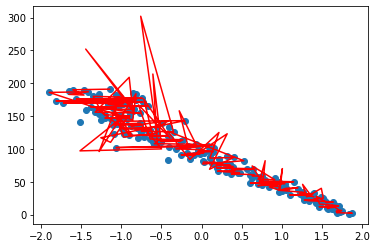

MID-33
acc at MID-33 >>  0.9212540313507838


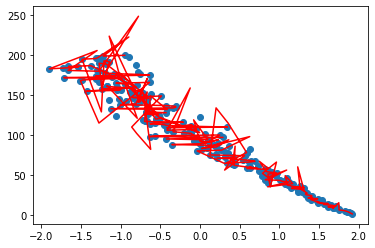

MID-34
acc at MID-34 >>  0.9312207674505171


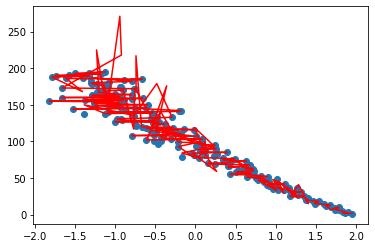

MID-35
acc at MID-35 >>  0.9174346831805396


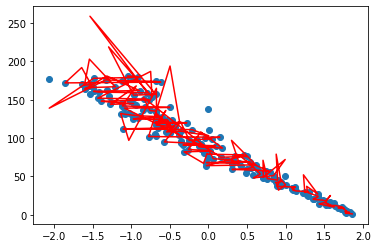

MID-36
acc at MID-36 >>  0.665272704869029


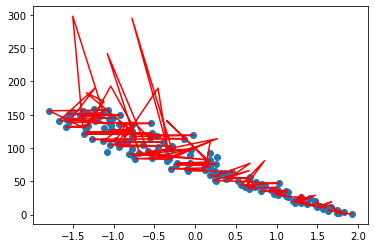

MID-37
acc at MID-37 >>  0.924609644542962


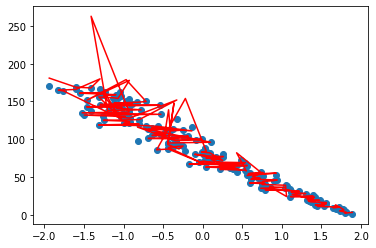

MID-38
acc at MID-38 >>  0.8854014208642701


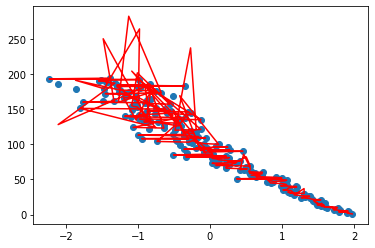

MID-39
acc at MID-39 >>  0.5398035501739609


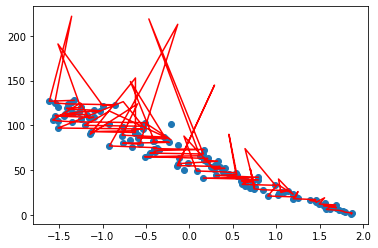

MID-40
acc at MID-40 >>  0.924981985057079


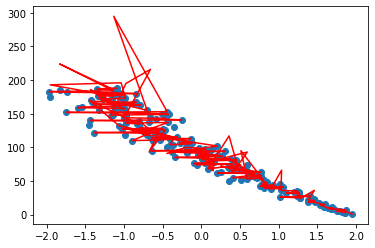

MID-41
acc at MID-41 >>  0.9422034079948558


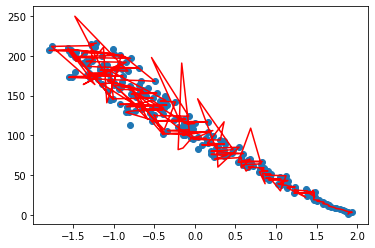

MID-42
acc at MID-42 >>  0.800921196280152


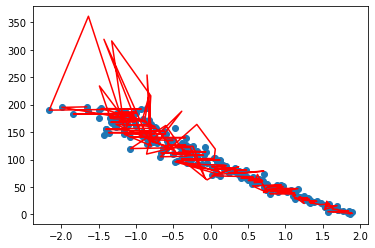

MID-43
acc at MID-43 >>  0.9413467626716888


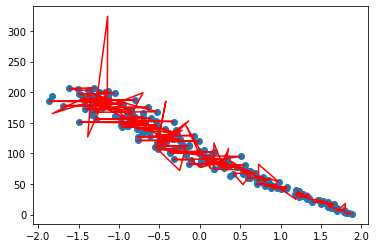

MID-44
acc at MID-44 >>  0.9121900686325042


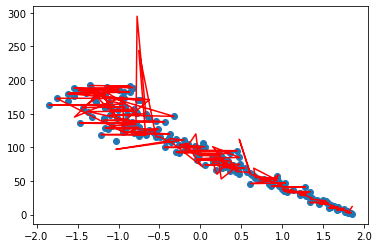

MID-45
acc at MID-45 >>  0.7904889109299484


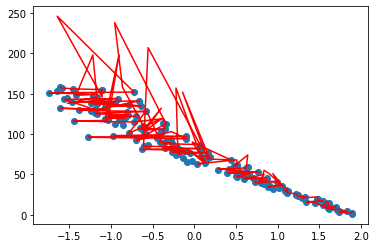

MID-46
acc at MID-46 >>  0.9365794518196383


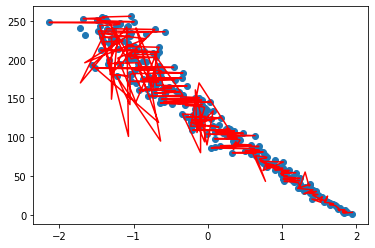

MID-47
acc at MID-47 >>  0.9183566952683281


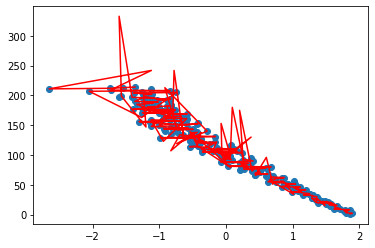

MID-48
acc at MID-48 >>  0.9224381315835589


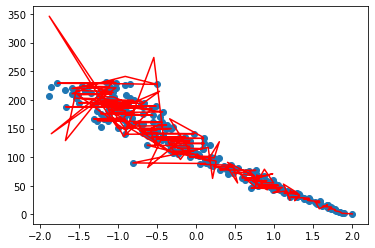

MID-49
acc at MID-49 >>  0.9474184356057862


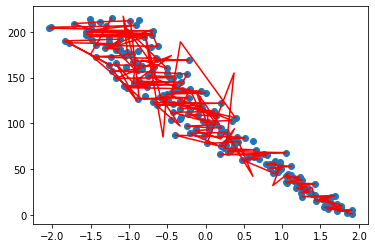

MID-50
acc at MID-50 >>  0.9336878207372813


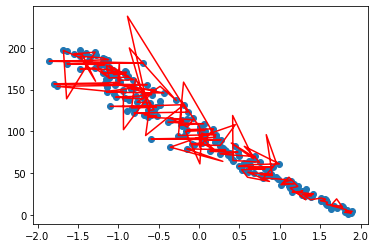

MID-51
acc at MID-51 >>  0.9471501908648151


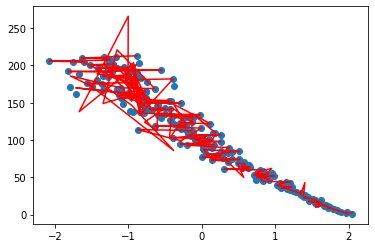

MID-52
acc at MID-52 >>  0.9460983854103283


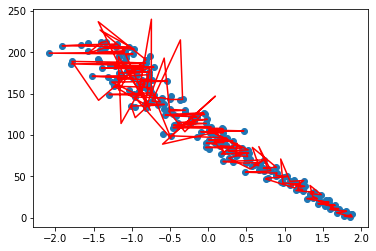

MID-53
acc at MID-53 >>  0.9113580087070514


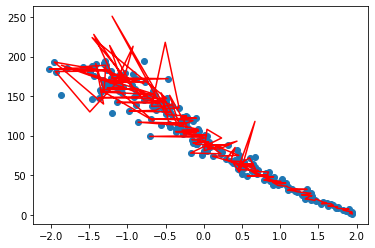

MID-54
acc at MID-54 >>  0.9212569493145417


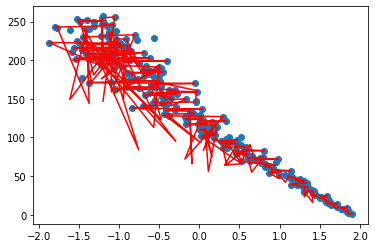

MID-55
acc at MID-55 >>  0.8802180706158859


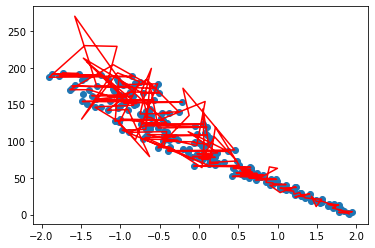

MID-56
acc at MID-56 >>  0.9445988286546839


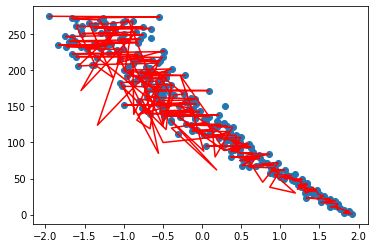

MID-57
acc at MID-57 >>  0.7530569193720014


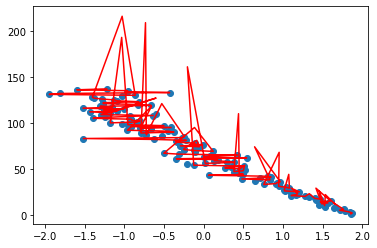

MID-58
acc at MID-58 >>  0.4947789556400124


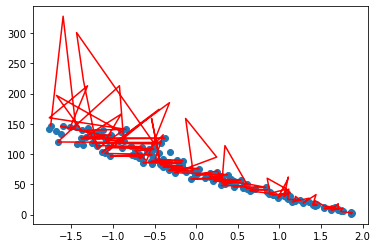

MID-59
acc at MID-59 >>  0.952242060787788


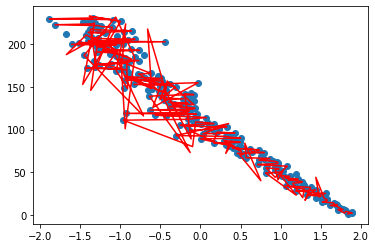

MID-60
acc at MID-60 >>  0.8526259188770421


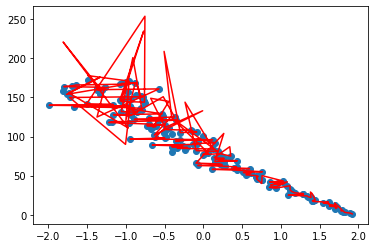

MID-61
acc at MID-61 >>  0.8901325764754937


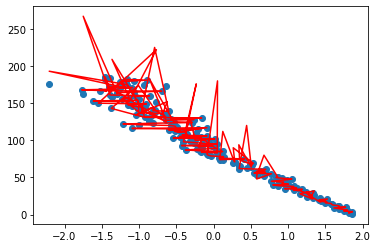

MID-62
acc at MID-62 >>  0.8794468965091515


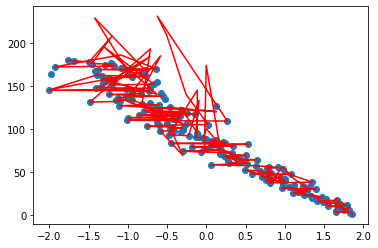

MID-63
acc at MID-63 >>  0.8814408155129702


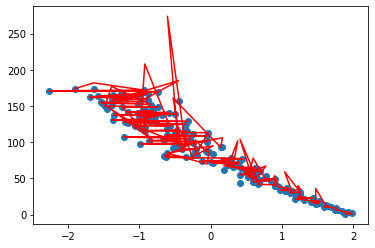

MID-64
acc at MID-64 >>  0.8817904986493655


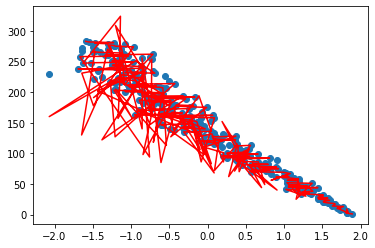

MID-65
acc at MID-65 >>  0.8457038317719432


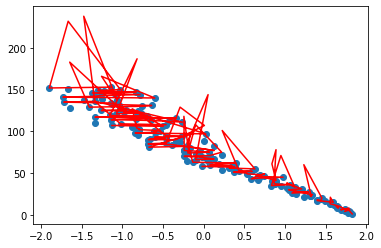

MID-66
acc at MID-66 >>  0.9477659257727846


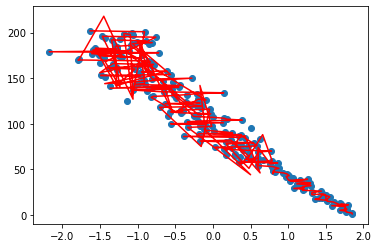

MID-67
acc at MID-67 >>  0.8685540665557352


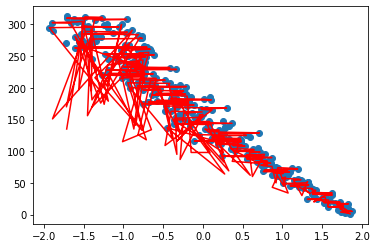

MID-68
acc at MID-68 >>  0.9313339424394701


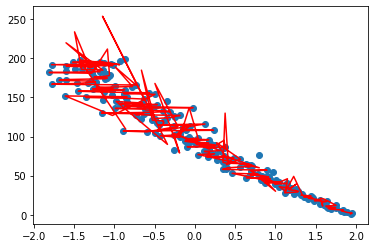

MID-69
acc at MID-69 >>  0.8577613362371923


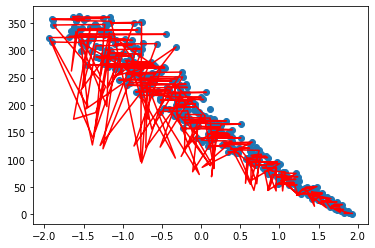

MID-70
acc at MID-70 >>  0.5690478746243023


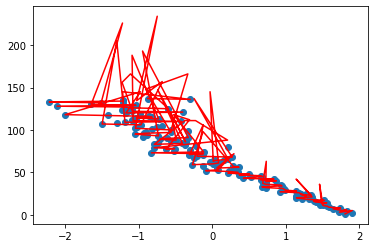

MID-71
acc at MID-71 >>  0.9414689048556325


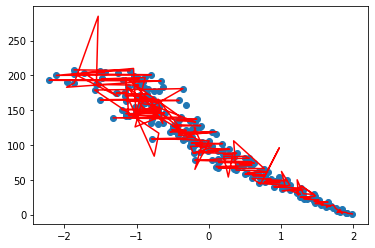

MID-72
acc at MID-72 >>  0.890007165191821


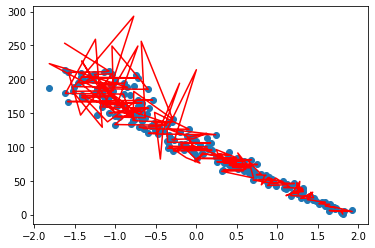

MID-73
acc at MID-73 >>  0.9134983148760311


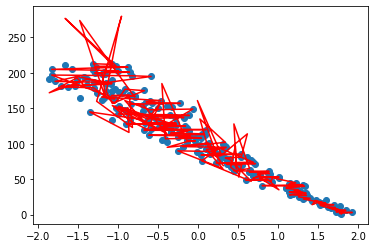

MID-74
acc at MID-74 >>  0.7561503499026044


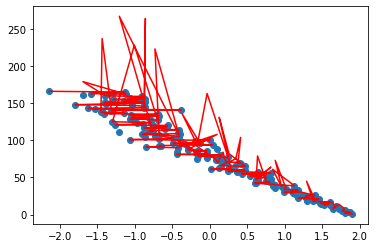

MID-75
acc at MID-75 >>  0.9397849569814036


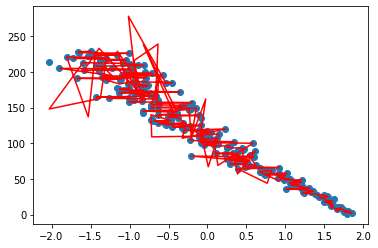

MID-76
acc at MID-76 >>  0.8826286958240064


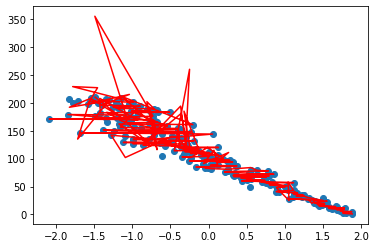

MID-77
acc at MID-77 >>  0.7818116102746084


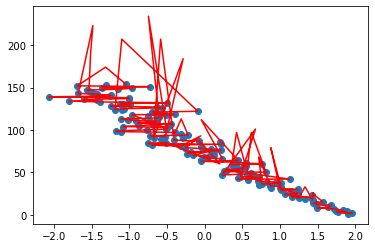

MID-78
acc at MID-78 >>  0.9588455772113943


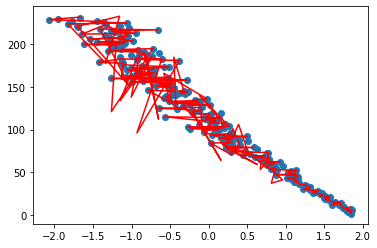

MID-79
acc at MID-79 >>  0.9322141008070657


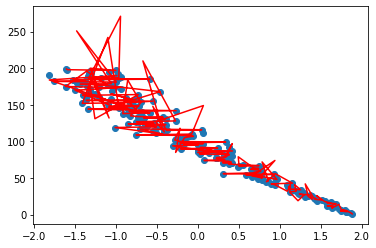

MID-80
acc at MID-80 >>  0.8722636556612714


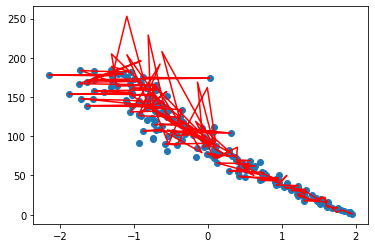

MID-81
acc at MID-81 >>  0.9263824024722651


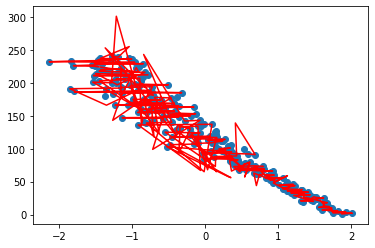

MID-82
acc at MID-82 >>  0.9634543623400914


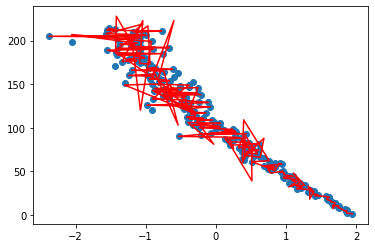

MID-83
acc at MID-83 >>  0.9053073962297996


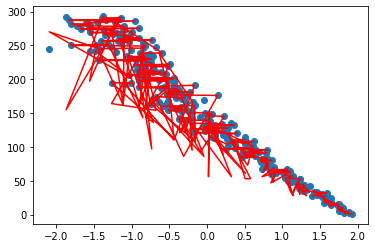

MID-84
acc at MID-84 >>  0.9393553479539869


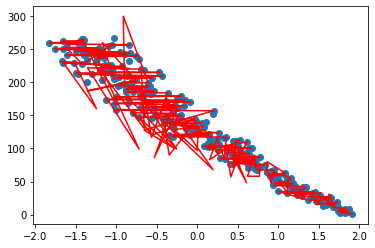

MID-85
acc at MID-85 >>  0.8605652447955326


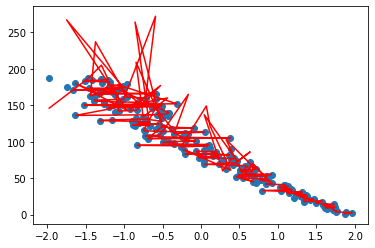

MID-86
acc at MID-86 >>  0.9046090250194162


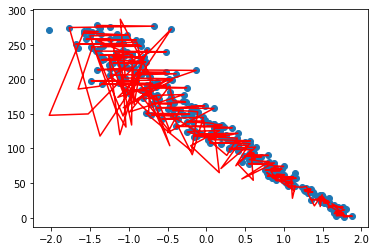

MID-87
acc at MID-87 >>  0.9081164641159066


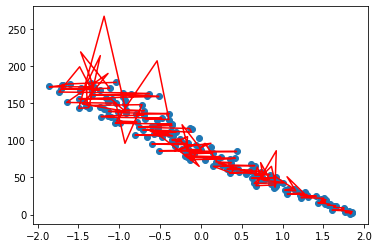

MID-88
acc at MID-88 >>  0.9198057326501772


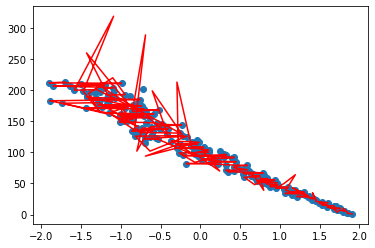

MID-89
acc at MID-89 >>  0.9569328767316337


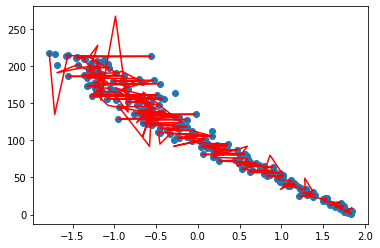

MID-90
acc at MID-90 >>  0.6948273737647552


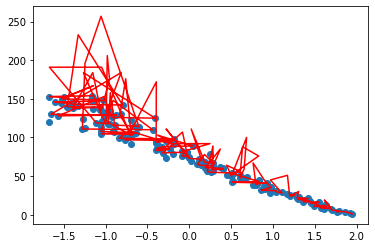

MID-91
acc at MID-91 >>  0.774280557994342


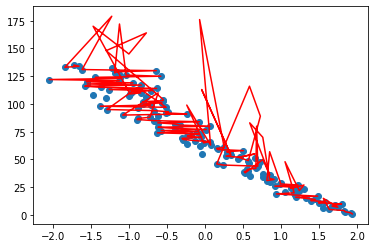

MID-92
acc at MID-92 >>  0.8520147293367107


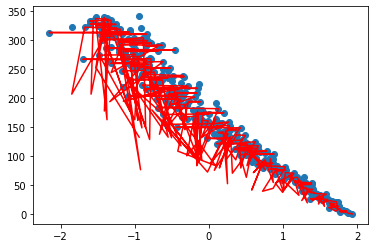

MID-93
acc at MID-93 >>  0.9195256356546679


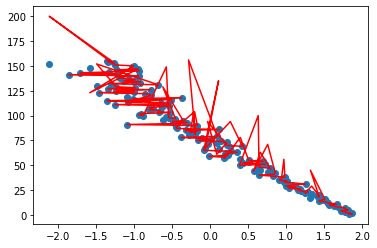

MID-94
acc at MID-94 >>  0.9550729873325113


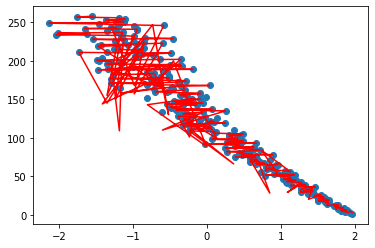

MID-95
acc at MID-95 >>  0.9167302892613178


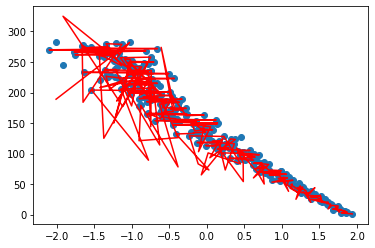

MID-96
acc at MID-96 >>  0.8808781706136549


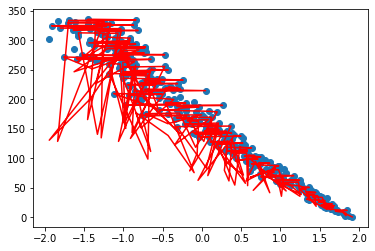

MID-97
acc at MID-97 >>  0.9078227358064092


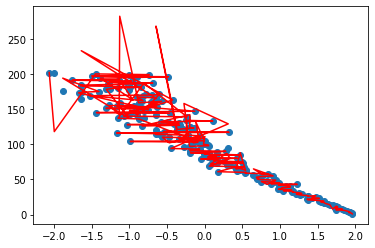

MID-98
acc at MID-98 >>  0.8338354064263248


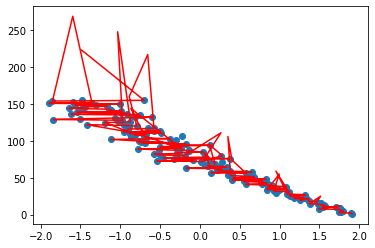

MID-99
acc at MID-99 >>  0.9192866077859065


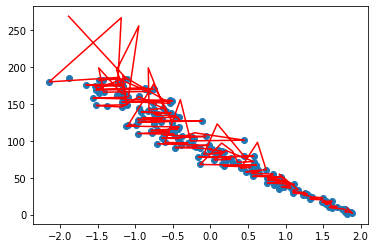

MID-100
acc at MID-100 >>  0.864155103877597


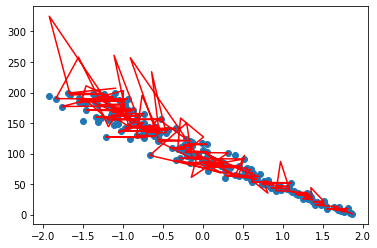

In [53]:
# Now, trying to check this in all machine-id        
graphs(dt_reg)

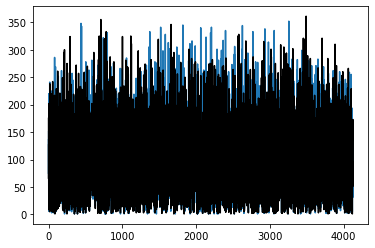

In [54]:
plt.plot(y_test)
plt.plot(dt_pred,c='k')

### Testing on the test_data (test_FD001.txt)

In [55]:
df_test = pd.read_csv(test_file, sep=" ",header=None)
df_test.drop(columns=[26,27],inplace=True)
df_test.columns = columns
df_test.head()

,Section-0,Section-1,Section-2,Section-3,Section-4,Section-5,Section-6,Section-7,Section-8,Section-9,...,Section-16,Section-17,Section-18,Section-19,Section-20,Section-21,Section-22,Section-23,Section-24,Section-25
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


In [56]:
df_rul = pd.read_csv(RUL_file, names=['rul'])
df_rul.head()

,rul
0,112
1,98
2,69
3,82
4,91


#### Now, converting the test data like train data for prediction 

In [57]:
df_test.drop(df_test[["Section-4", # Operatinal Setting
                "Section-5", # Sensor data
                "Section-9", # Sensor data
                "Section-10", # Sensor data
                "Section-14",# Sensor data
                "Section-20",# Sensor data
                "Section-22",# Sensor data
                "Section-23"]], axis=1 , inplace=True)

test_mid = df_test["Section-0"]
df_test.head()

,Section-0,Section-1,Section-2,Section-3,Section-6,Section-7,Section-8,Section-11,Section-12,Section-13,Section-15,Section-16,Section-17,Section-18,Section-19,Section-21,Section-24,Section-25
0,1,1,0.0023,0.0003,643.02,1585.29,1398.21,553.90,2388.04,9050.17,47.20,521.72,2388.03,8125.55,8.4052,392,38.86,23.3735
1,1,2,-0.0027,-0.0003,641.71,1588.45,1395.42,554.85,2388.01,9054.42,47.50,522.16,2388.06,8139.62,8.3803,393,39.02,23.3916
2,1,3,0.0003,0.0001,642.46,1586.94,1401.34,554.11,2388.05,9056.96,47.50,521.97,2388.03,8130.10,8.4441,393,39.08,23.4166
3,1,4,0.0042,0.0000,642.44,1584.12,1406.42,554.07,2388.03,9045.29,47.28,521.38,2388.05,8132.90,8.3917,391,39.00,23.3737
4,1,5,0.0014,0.0000,642.51,1587.19,1401.92,554.16,2388.01,9044.55,47.31,522.15,2388.03,8129.54,8.4031,390,38.99,23.4130


### CAN BE DONE MORE BETTER FROM HERE

----------------MachineID-1----------------


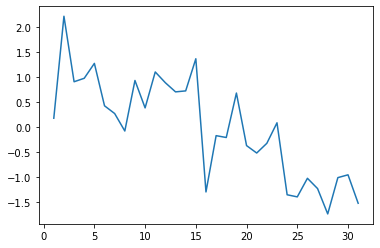

----------------MachineID-2----------------


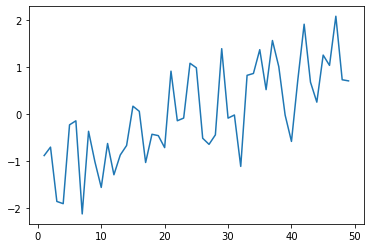

----------------MachineID-3----------------


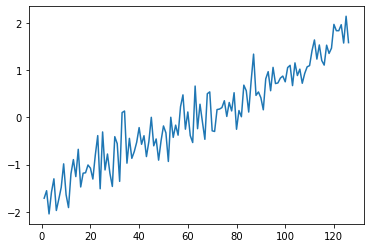

----------------MachineID-4----------------


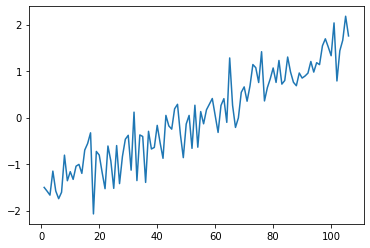

----------------MachineID-5----------------


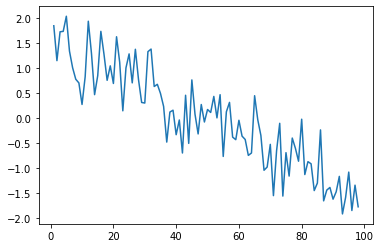

----------------MachineID-6----------------


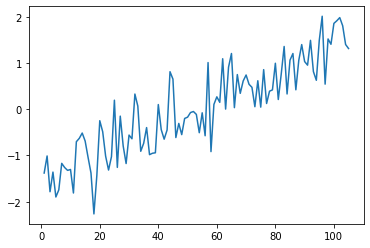

----------------MachineID-7----------------


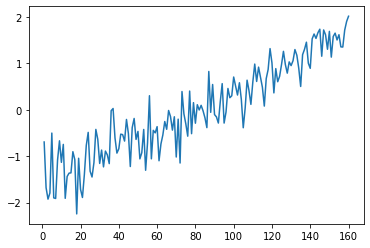

----------------MachineID-8----------------


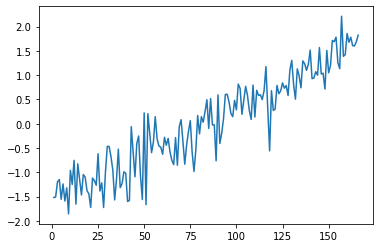

----------------MachineID-9----------------


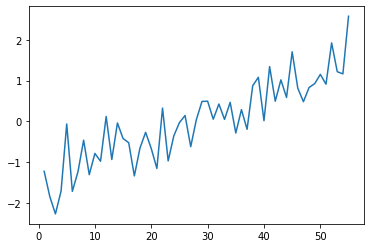

----------------MachineID-10----------------


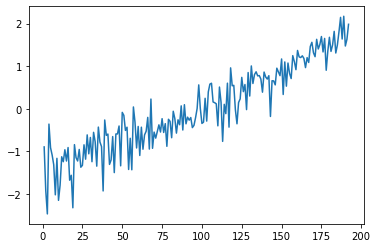

----------------MachineID-11----------------


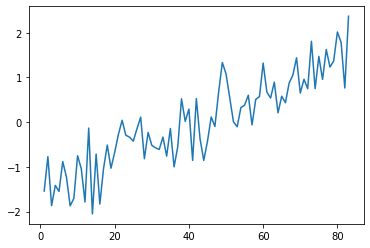

----------------MachineID-12----------------


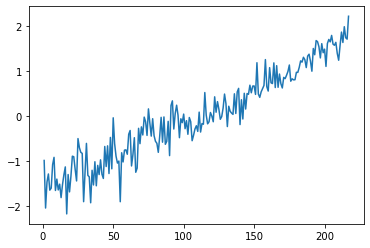

----------------MachineID-13----------------


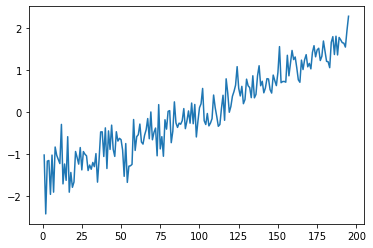

----------------MachineID-14----------------


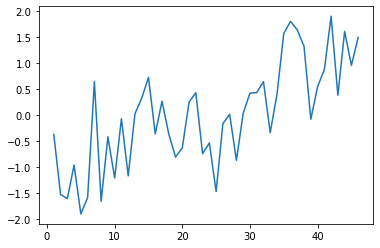

----------------MachineID-15----------------


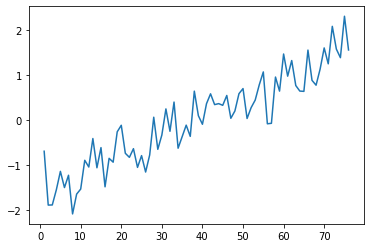

----------------MachineID-16----------------


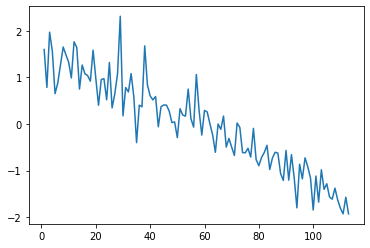

----------------MachineID-17----------------


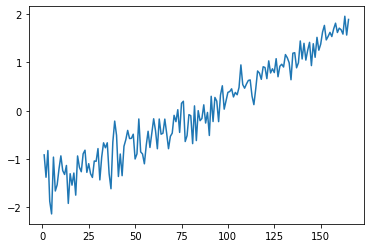

----------------MachineID-18----------------


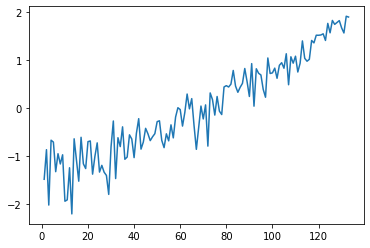

----------------MachineID-19----------------


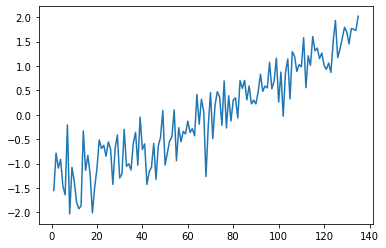

----------------MachineID-20----------------


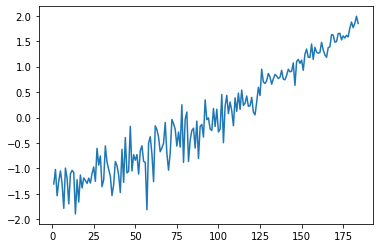

----------------MachineID-21----------------


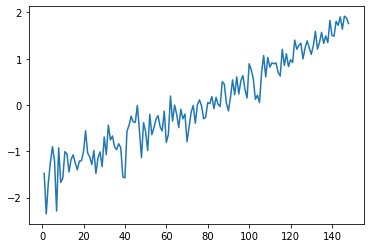

----------------MachineID-22----------------


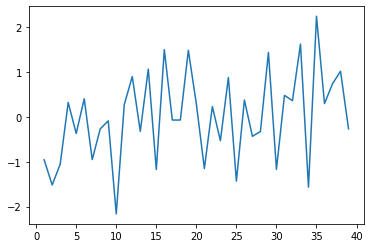

----------------MachineID-23----------------


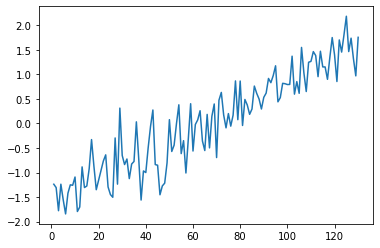

----------------MachineID-24----------------


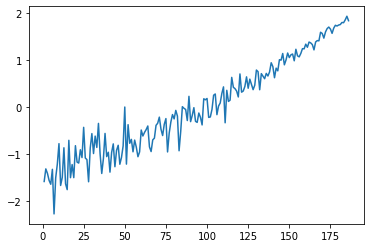

----------------MachineID-25----------------


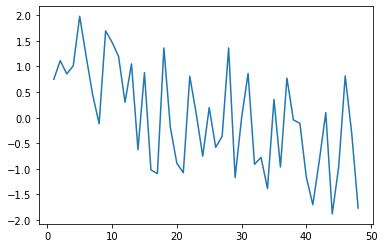

----------------MachineID-26----------------


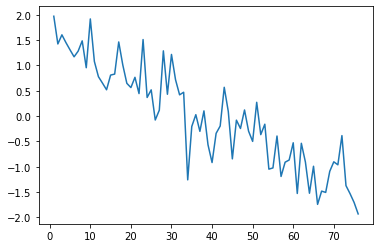

----------------MachineID-27----------------


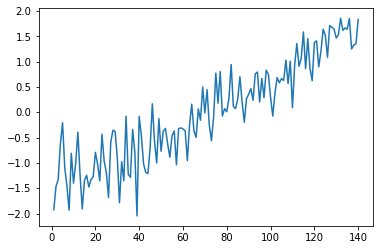

----------------MachineID-28----------------


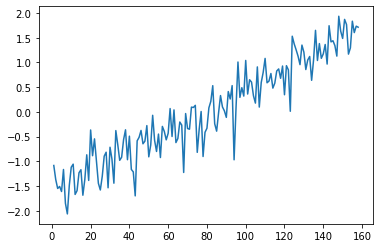

----------------MachineID-29----------------


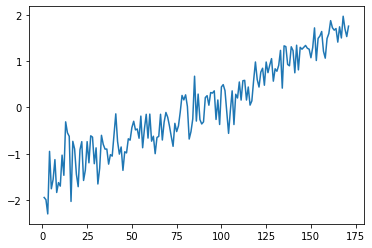

----------------MachineID-30----------------


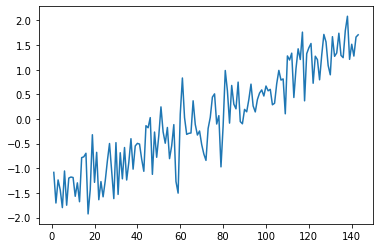

----------------MachineID-31----------------


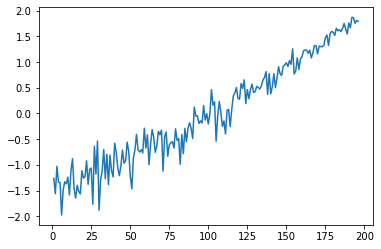

----------------MachineID-32----------------


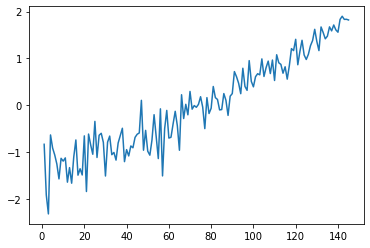

----------------MachineID-33----------------


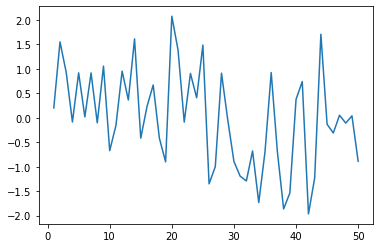

----------------MachineID-34----------------


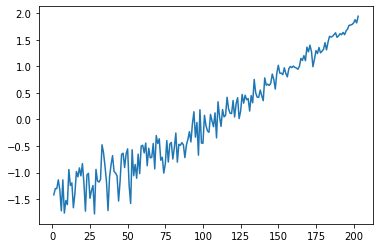

----------------MachineID-35----------------


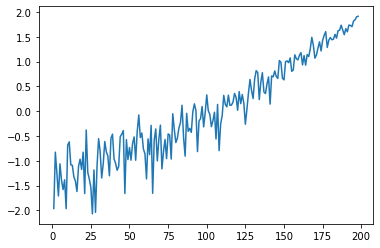

----------------MachineID-36----------------


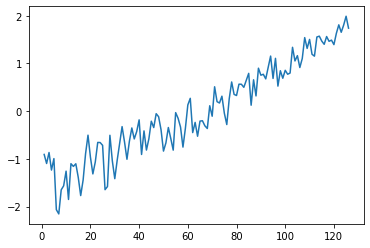

----------------MachineID-37----------------


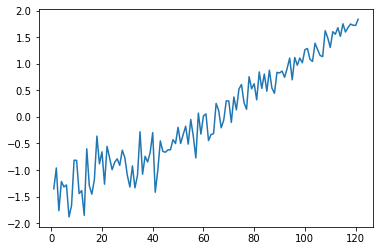

----------------MachineID-38----------------


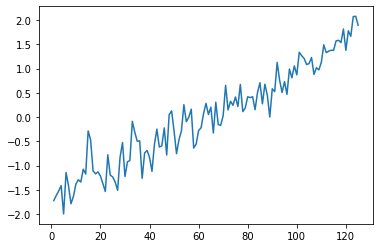

----------------MachineID-39----------------


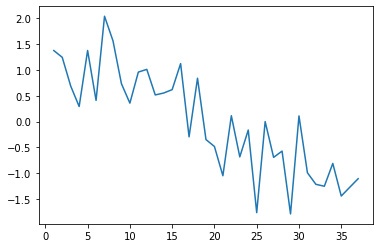

----------------MachineID-40----------------


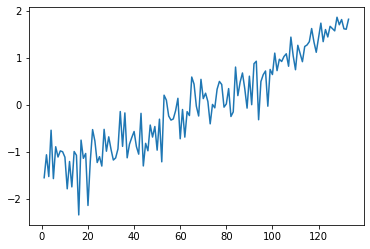

----------------MachineID-41----------------


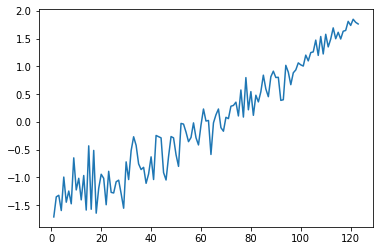

----------------MachineID-42----------------


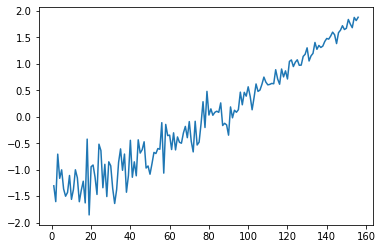

----------------MachineID-43----------------


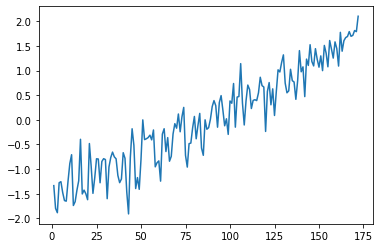

----------------MachineID-44----------------


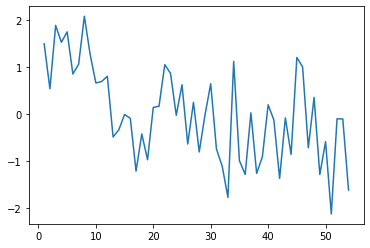

----------------MachineID-45----------------


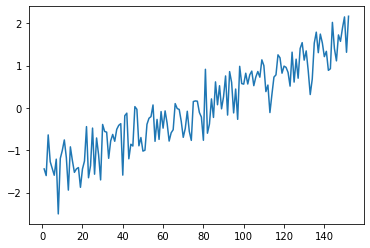

----------------MachineID-46----------------


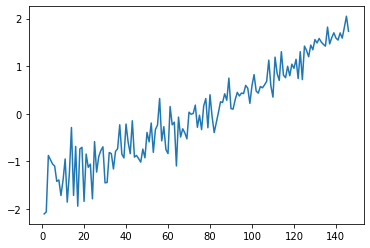

----------------MachineID-47----------------


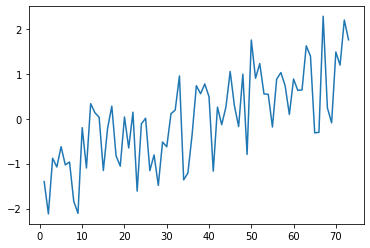

----------------MachineID-48----------------


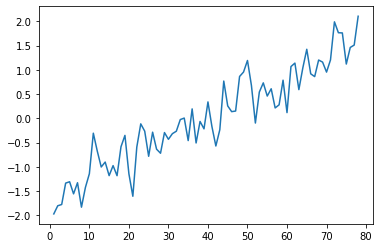

----------------MachineID-49----------------


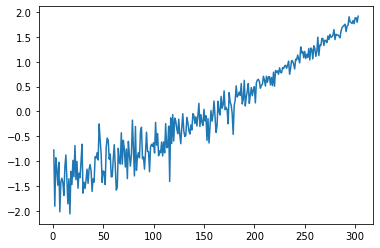

----------------MachineID-50----------------


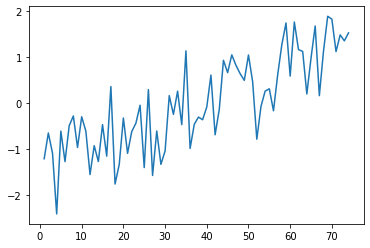

----------------MachineID-51----------------


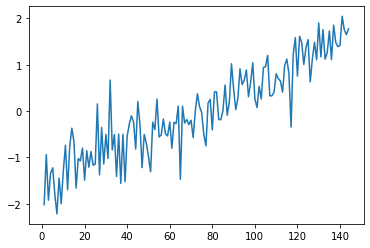

----------------MachineID-52----------------


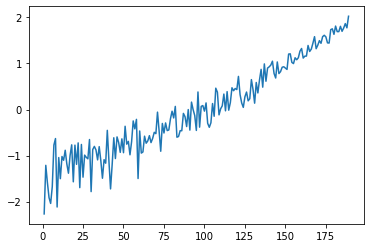

----------------MachineID-53----------------


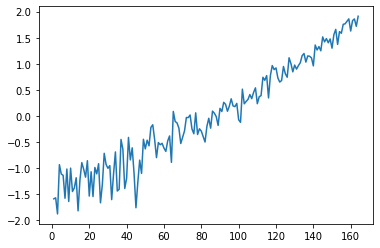

----------------MachineID-54----------------


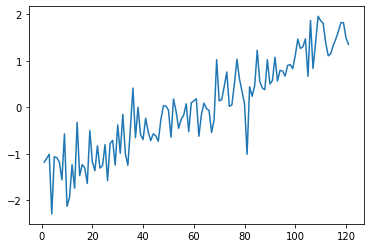

----------------MachineID-55----------------


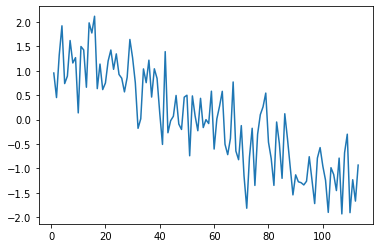

----------------MachineID-56----------------


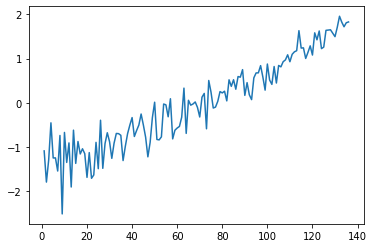

----------------MachineID-57----------------


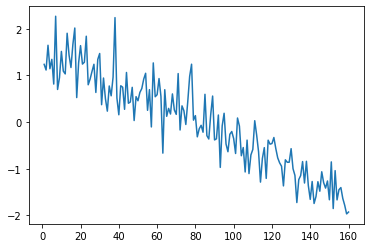

----------------MachineID-58----------------


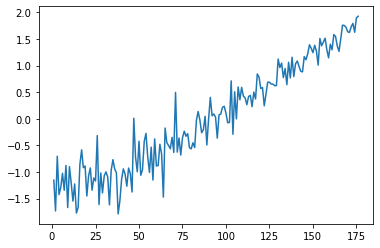

----------------MachineID-59----------------


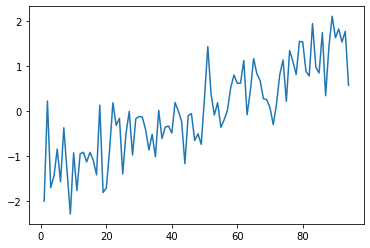

----------------MachineID-60----------------


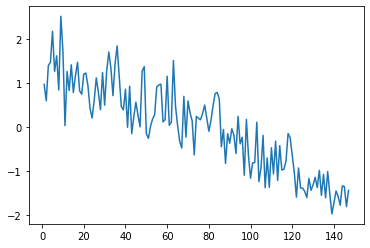

----------------MachineID-61----------------


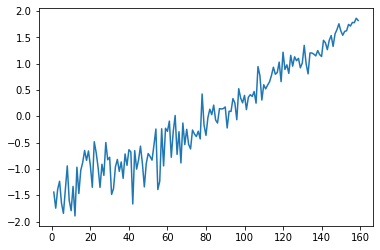

----------------MachineID-62----------------


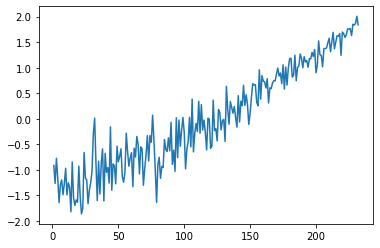

----------------MachineID-63----------------


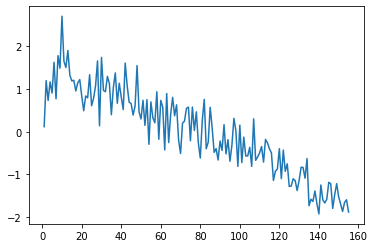

----------------MachineID-64----------------


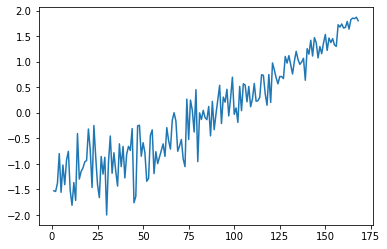

----------------MachineID-65----------------


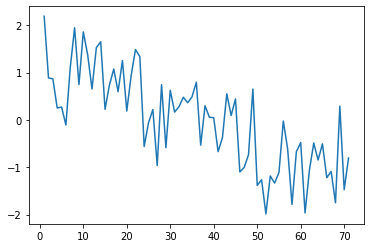

----------------MachineID-66----------------


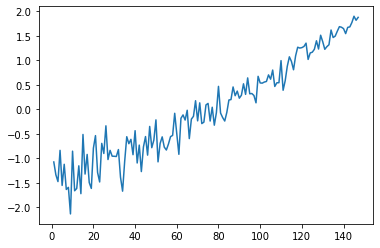

----------------MachineID-67----------------


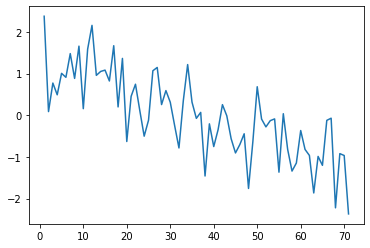

----------------MachineID-68----------------


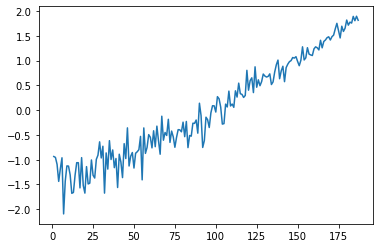

----------------MachineID-69----------------


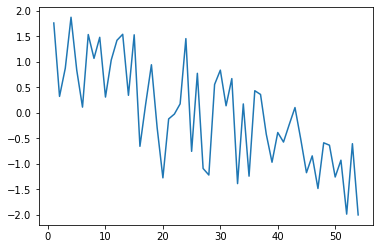

----------------MachineID-70----------------


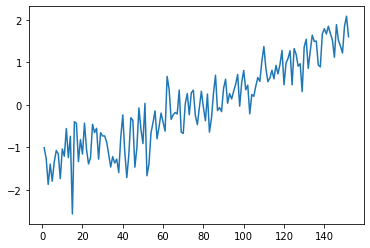

----------------MachineID-71----------------


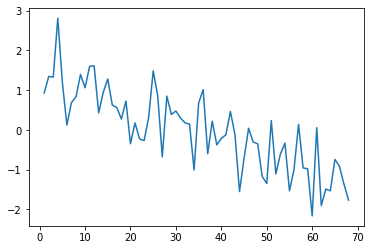

----------------MachineID-72----------------


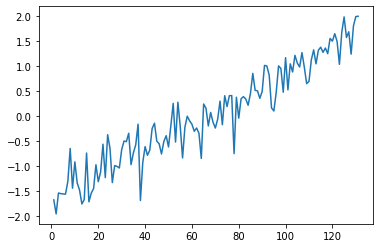

----------------MachineID-73----------------


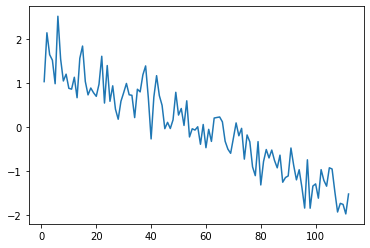

----------------MachineID-74----------------


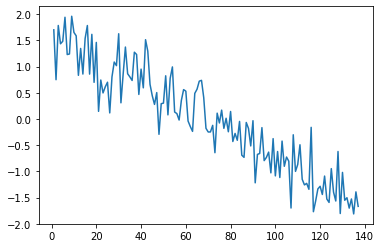

----------------MachineID-75----------------


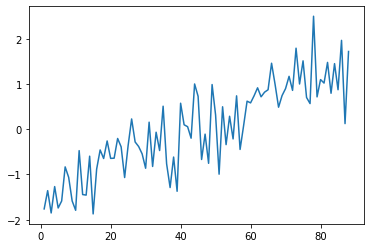

----------------MachineID-76----------------


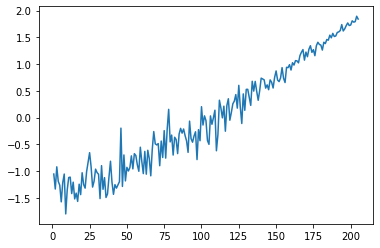

----------------MachineID-77----------------


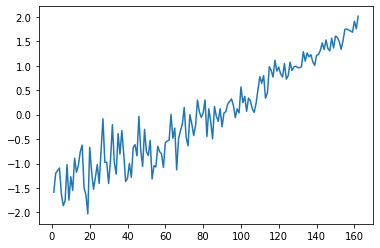

----------------MachineID-78----------------


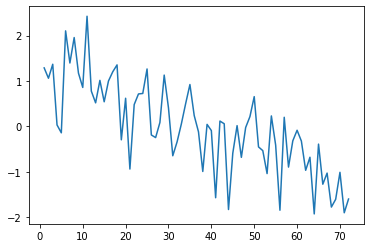

----------------MachineID-79----------------


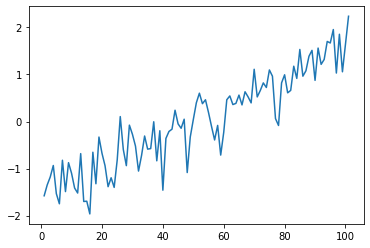

----------------MachineID-80----------------


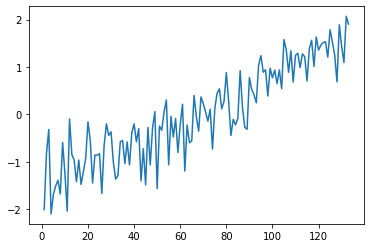

----------------MachineID-81----------------


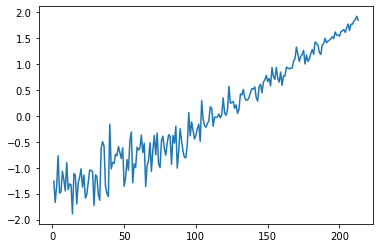

----------------MachineID-82----------------


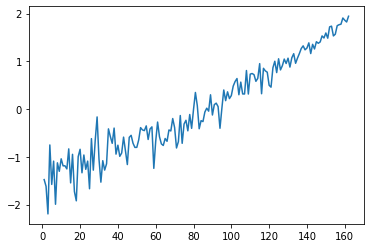

----------------MachineID-83----------------


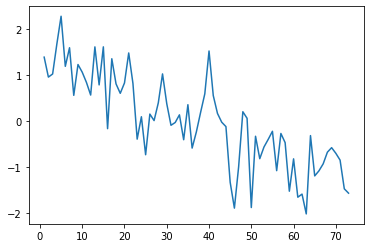

----------------MachineID-84----------------


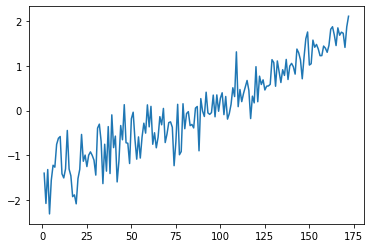

----------------MachineID-85----------------


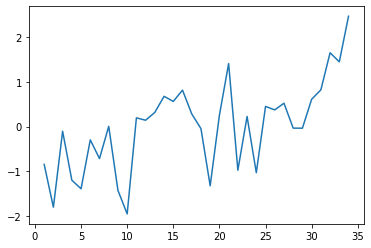

----------------MachineID-86----------------


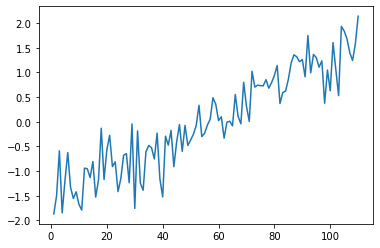

----------------MachineID-87----------------


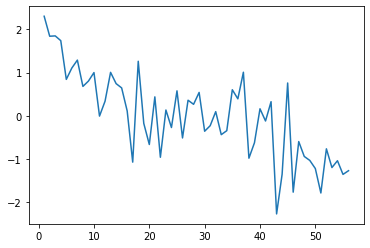

----------------MachineID-88----------------


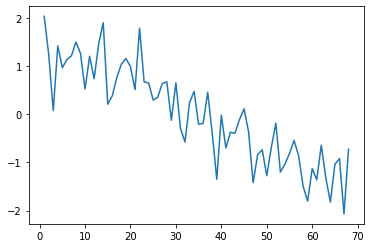

----------------MachineID-89----------------


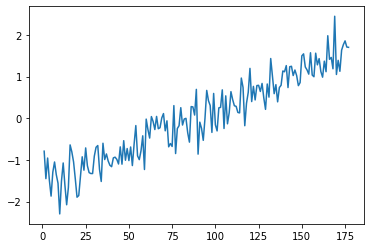

----------------MachineID-90----------------


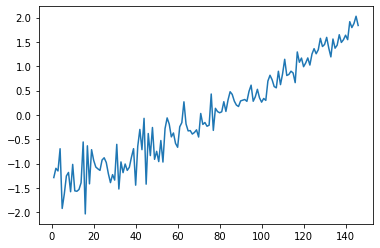

----------------MachineID-91----------------


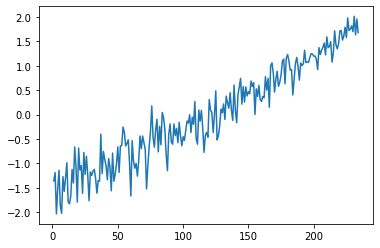

----------------MachineID-92----------------


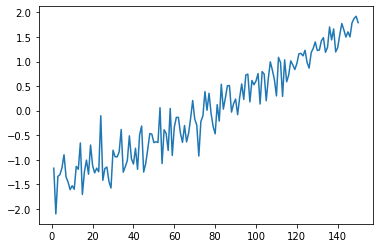

----------------MachineID-93----------------


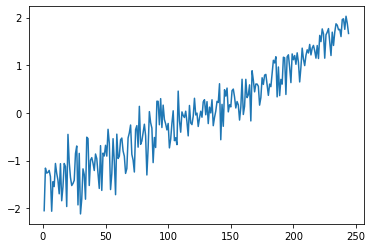

----------------MachineID-94----------------


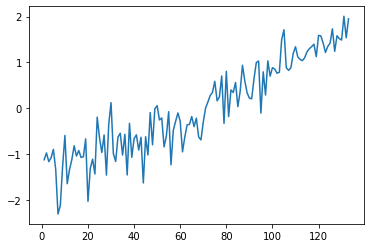

----------------MachineID-95----------------


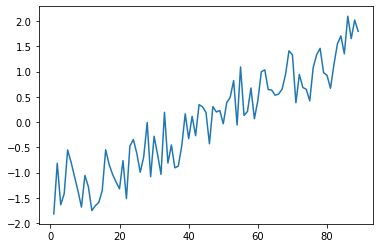

----------------MachineID-96----------------


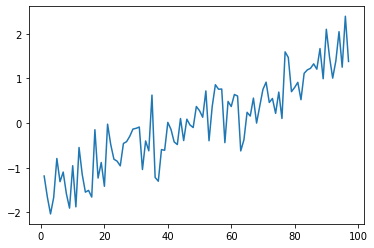

----------------MachineID-97----------------


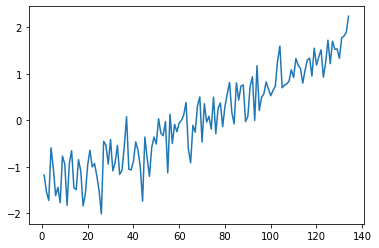

----------------MachineID-98----------------


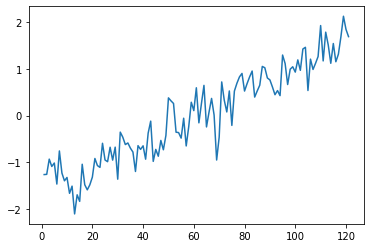

----------------MachineID-99----------------


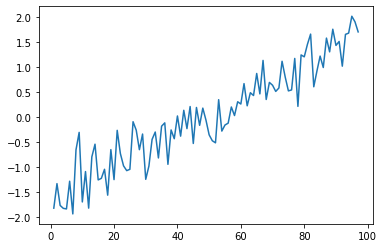

----------------MachineID-100----------------


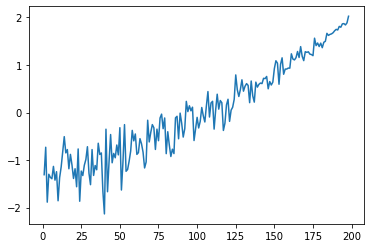

In [58]:
test_lst=data_processing(df_test,test_mid)

In [59]:
test_process_data_lst = [j for i in test_lst for j in i.reshape(1,-1)[0]]
test_process_df = pd.DataFrame({"MID":test_mid, 'data':test_process_data_lst})
test_process_df.head()

,MID,data
0,1,0.180480
1,1,2.224649
2,1,0.911498
3,1,0.981009
4,1,1.279417


In [60]:
val = test_process_df.groupby('MID')
val = [np.array(val.get_group(i)['data']).reshape(-1,1) for i in range(1,101)]
# print(val)
# print(np.array(test_rul_csv)[2][0])

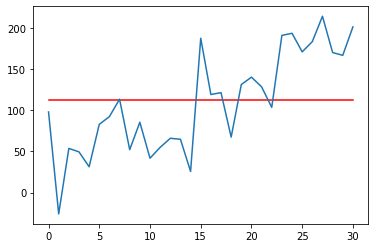

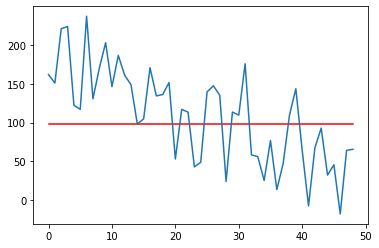

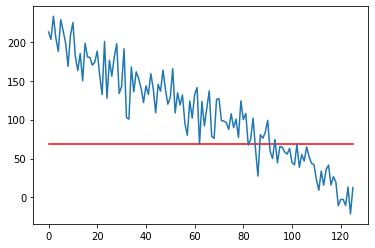

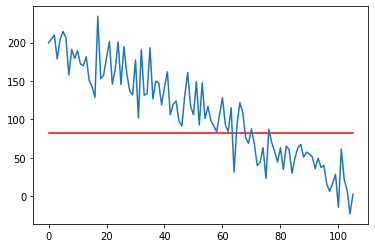

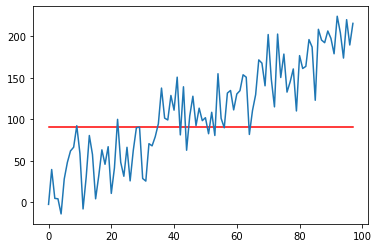

...

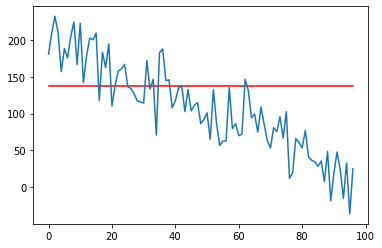

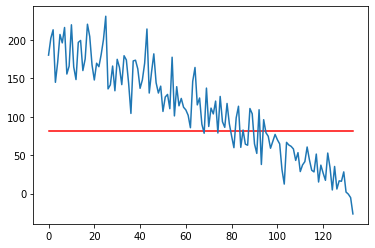

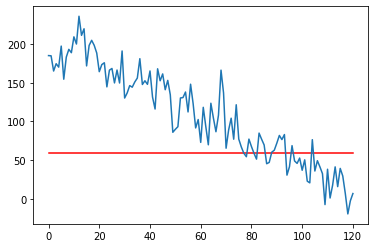

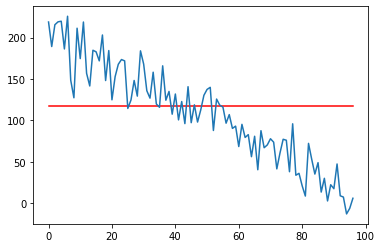

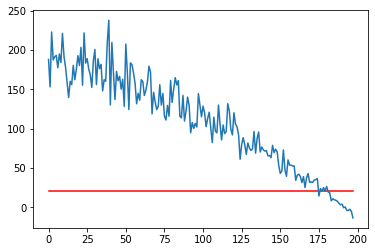

In [61]:
# lr prediction
count = 0
rul = np.array(df_rul)
for mid_val in val:
    lr_predict = reg.predict(mid_val)
    plt.plot([i for i in range(len(mid_val))], [rul[count][0] for i in range(len(mid_val))], c='r')
    plt.plot(lr_predict)
    count = count +1
    plt.show()